## Fit autocovariance

Objective : Estimate tides paramters by fitting a model to Eulerian and Lagrangian binned covariance of the demodulated velocity field

Several parameters of the fitting method can be testing.
Here we focus on a least-square method.

1) Basic method :

Model : $\tilde V e^{-\tau/\tilde T}cos(\omega\tau)$ ; with $\tilde V$ the variance, $\tilde T$ the incoherence timescale and $\omega = \frac{\omega_{S2}-\omega_{M2}}{2}$ fixed the spring neap cycle frequency over 2 (oscilations caused by demodulation)

No bounds, no first guess for the estimates, same weight at all timelag

2) Bounds imposed

3) More weight on the shortest timelags (20days) and a lot on the first. First guess for $\tilde V$ fixed at the autocovariance at timelag 0

In [1]:
import os
from glob import glob
import threading

import numpy as np
import dask.dataframe as dd
from dask import delayed
import pandas as pd
import xarray as xr
import scipy.optimize
#import mitequinox.sigp as sp

%matplotlib inline
from matplotlib import pyplot as plt
#import matplotlib.animation as anima

from inspect import signature
import scipy

In [2]:
def get_tidal_frequencies(*args, units="cpd"):
    """
    """
    from pytide import WaveTable
    td = WaveTable()
    if units=="cpd":
        scale=86400/2/np.pi
    elif units=="cph":
        scale=3600/2/np.pi
    else:
        # cps
        scale=1/2/np.pi
    return {c: td.wave(c).freq * scale for c in args}

tidal_omega = get_tidal_frequencies("M2", "K2","S2","N2")
omega_M2,omega_S2,omega_N2,omega_K2, domega, name = tidal_omega["M2"],tidal_omega["S2"],tidal_omega["N2"],tidal_omega["K2"], .2, "semidiurnal"
omega = (omega_M2+omega_S2)/2

In [3]:
omega_sn = (omega_S2-omega_M2)/2

print('Spring-neap cycle : ', 1/(2*omega_sn), 'days')
print('Oscillation after demodulation ( spring-neap cycle /2): ', 1/omega_sn, 'days')

Spring-neap cycle :  14.765294045749723 days
Oscillation after demodulation ( spring-neap cycle /2):  29.530588091499446 days


In [4]:
def y_fit(tau,T,V):
    return V*np.exp(-tau/T)*np.cos(rad*omega_sn*tau)

def y_fit_low_v1(tau,T,V):
    return V*np.exp(-tau/T)

def y_fit_low(tau,T,V,c):
    return V*np.exp(-tau/T)+c

In [5]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
def plot_maps(ds,colmap='RdBu_r',vlim=(-0.01,0.01),axes=111,**kwargs):
    cbar_kw = {'fraction':0.02}
    if 'label' in kwargs.keys():
        cbar_kw['label'] = kwargs['label']
    crs = ccrs.Robinson()
    #fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(axes,projection=crs)
    ds.plot(vmax=vlim[1],vmin=vlim[0],y='lat_bin',ax=ax,
            transform=ccrs.PlateCarree(),cmap=colmap,**kwargs,
           cbar_kwargs=cbar_kw)
    ax.gridlines(draw_labels=True)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.LAND)
    return fig,ax

In [6]:
#root_path = '/home/datawork-lops-osi/equinox/jetn/'
root_path = '/Users/zcaspar/codes/mit4320/'
#low :
file_E = [root_path +'Ecov_SSU_low_mean0_dl2.nc',root_path +'Ecov_SSV_low_mean0_dl2.nc']
file_L = [root_path +'Lcov_SSU_low_mean0_dl2.nc',root_path +'Lcov_SSV_low_mean0_dl2.nc']

dsE_low = xr.merge([xr.open_dataset(f).rename({'lon_bins':'lon_bin','lat_bins':'lat_bin','rr':'rr'+f[-21:-17]}
                                             ) for f in file_E])
dsL_low = xr.merge([xr.open_dataset(f).rename({'lon_bins':'lon_bin','lat_bins':'lat_bin','rr':'rr'+f[-21:-17]}
                                             ) for f in file_L])


ds_low_dl1 = xr.merge([xr.open_dataset(root_path+'energy_SSU_low_binned_dl1.0.nc'),
                   xr.open_dataset(root_path+'energy_SSV_low_binned_dl1.0.nc')])

ds_low_dl2 = xr.merge([xr.open_dataset(root_path+'energy_SSU_low_binned_dl2.0.nc'),
                   xr.open_dataset(root_path+'energy_SSV_low_binned_dl2.0.nc')])

In [7]:
dsL_low

<xarray.Dataset>
Dimensions:  (lat_bin: 59, lon_bin: 179, lags: 961)
Coordinates:
  * lat_bin  (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 51.0 53.0 55.0 57.0
  * lon_bin  (lon_bin) float64 -179.0 -177.0 -175.0 -173.0 ... 173.0 175.0 177.0
  * lags     (lags) float64 0.0 0.04167 0.08333 0.125 ... 39.88 39.92 39.96 40.0
Data variables:
    rr_SSU   (lat_bin, lon_bin, lags) float64 ...
    count    (lat_bin, lon_bin) float64 0.0 1.0 0.0 0.0 ... 9.0 14.0 11.0 14.0
    rr_SSV   (lat_bin, lon_bin, lags) float64 ...

### Visualization energy

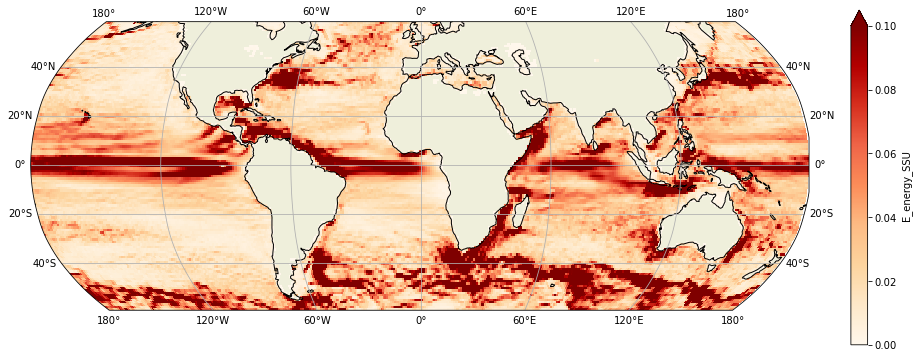

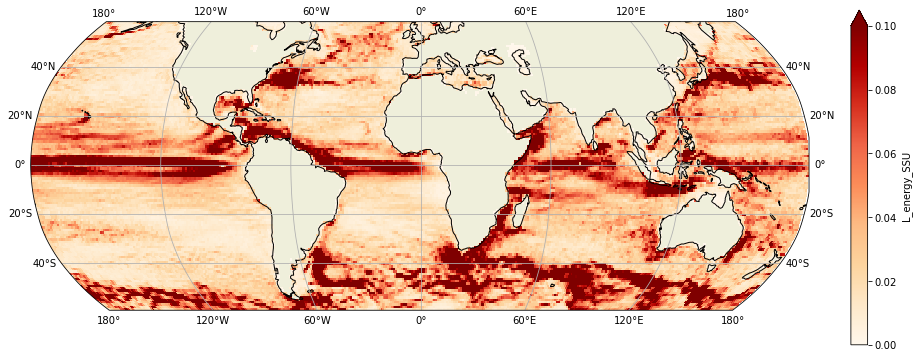

In [8]:
cmap = 'OrRd'
figsize=(15,15)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl1.E_energy_SSU,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl1.L_energy_SSU,vlim=(0,0.1),colmap=cmap)

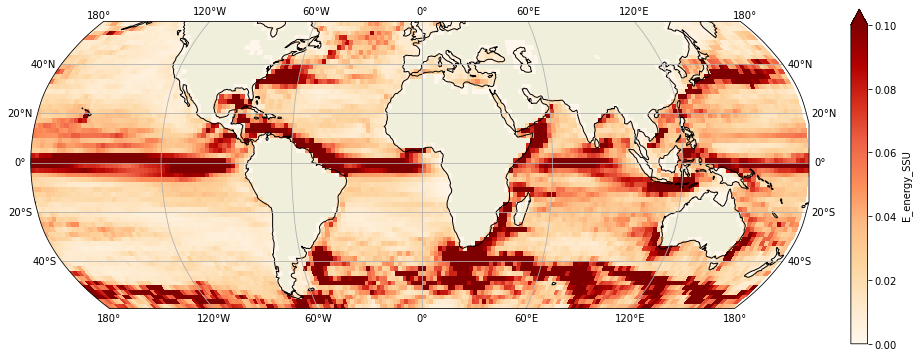

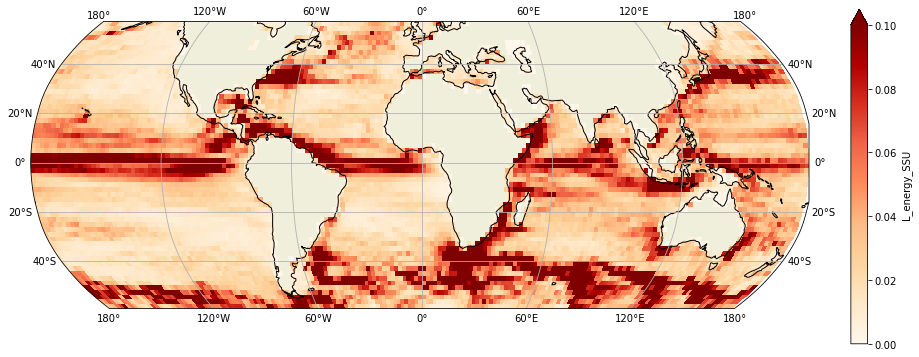

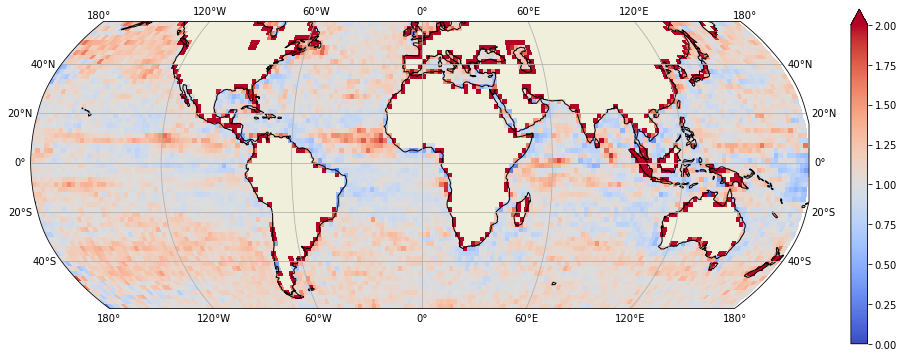

In [9]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.E_energy_SSU,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.L_energy_SSU,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.L_energy_SSU/ds_low_dl2.E_energy_SSU,vlim=(0,2),colmap='coolwarm')

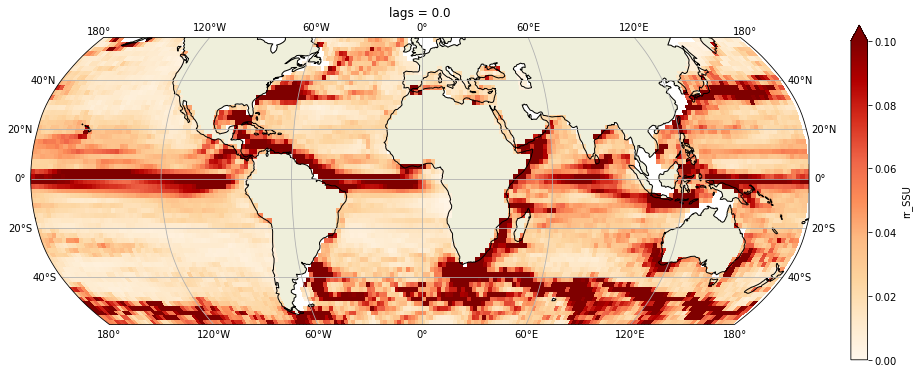

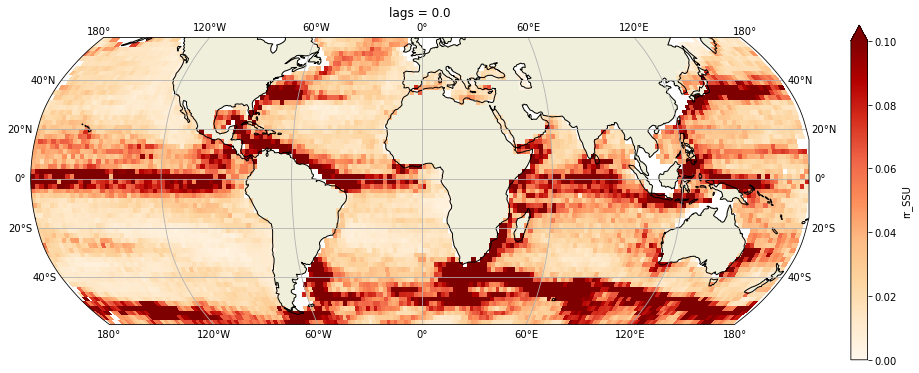

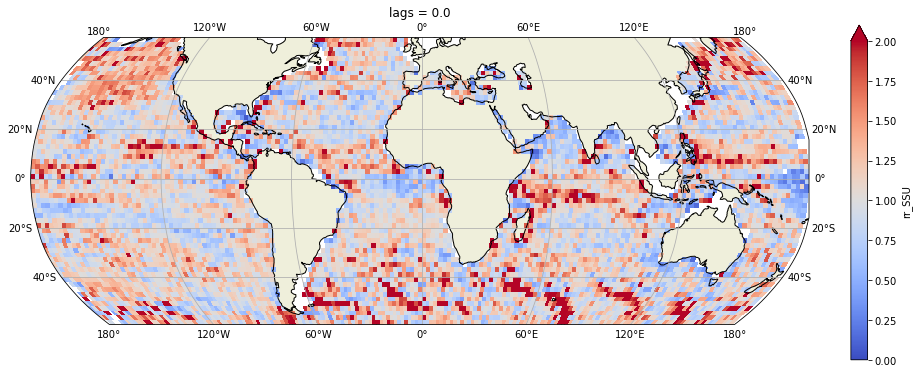

In [10]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low.rr_SSU.isel(lags=0),vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low.rr_SSU.isel(lags=0),vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps((dsL_low.rr_SSU/dsE_low.rr_SSU).isel(lags=0),vlim=(0,2),colmap='coolwarm')

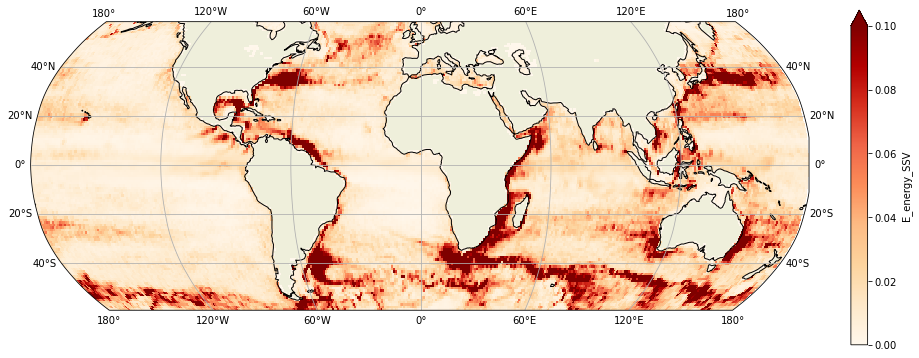

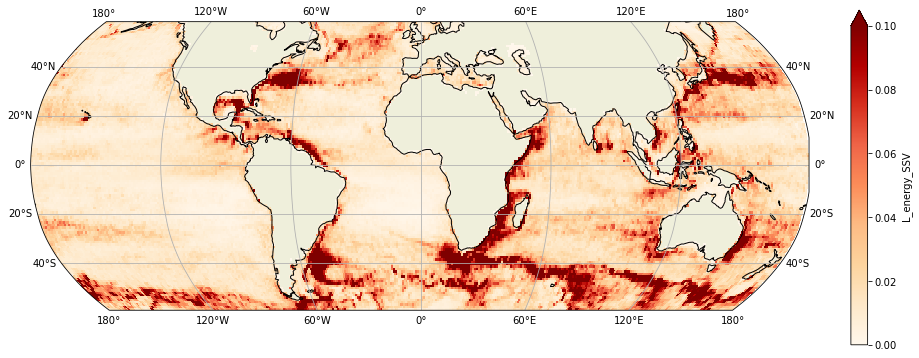

In [11]:
cmap = 'OrRd'
figsize=(15,15)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl1.E_energy_SSV,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl1.L_energy_SSV,vlim=(0,0.1),colmap=cmap)

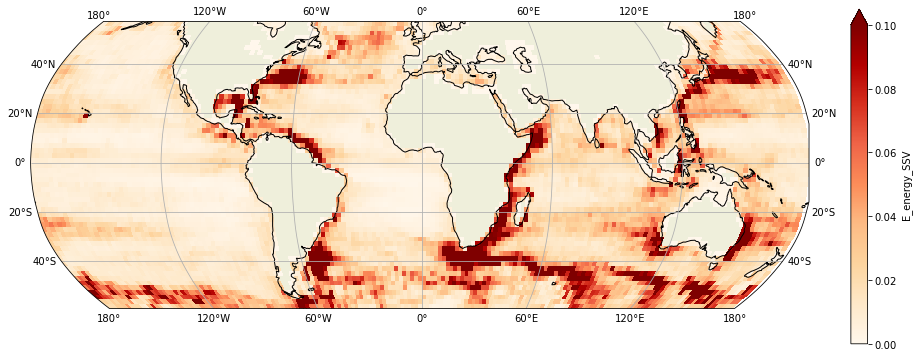

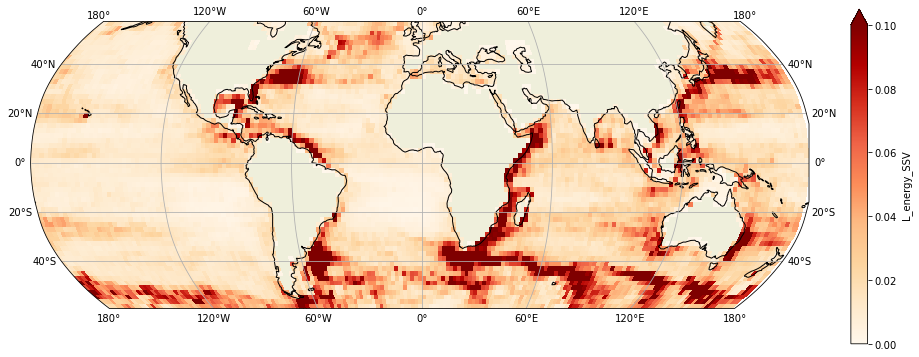

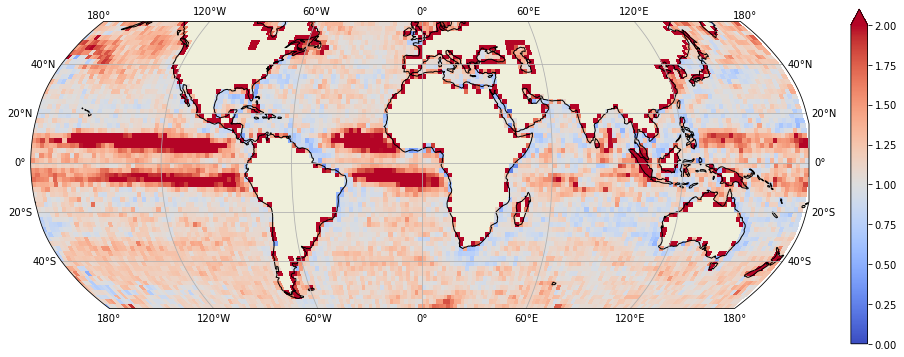

In [12]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.E_energy_SSV,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.L_energy_SSV,vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(ds_low_dl2.L_energy_SSV/ds_low_dl2.E_energy_SSV,vlim=(0,2),colmap='coolwarm')

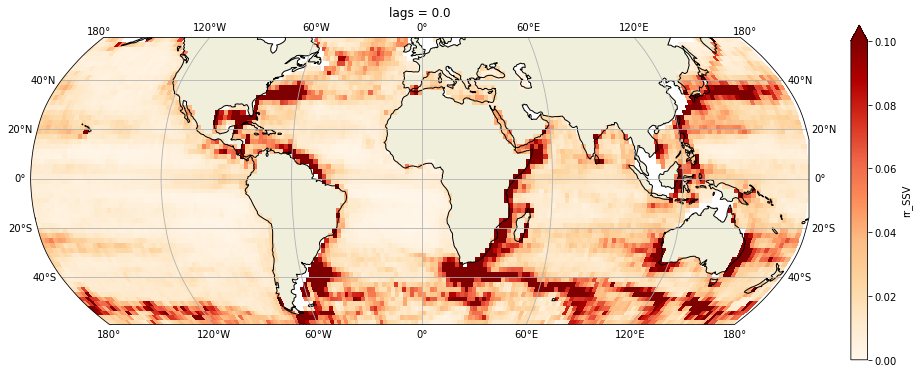

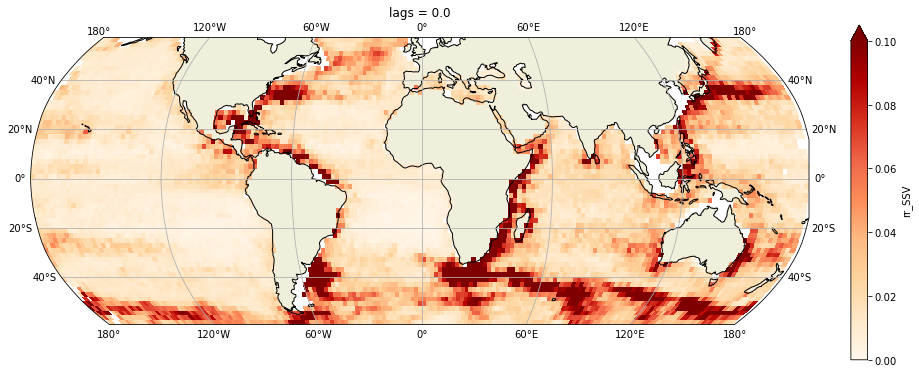

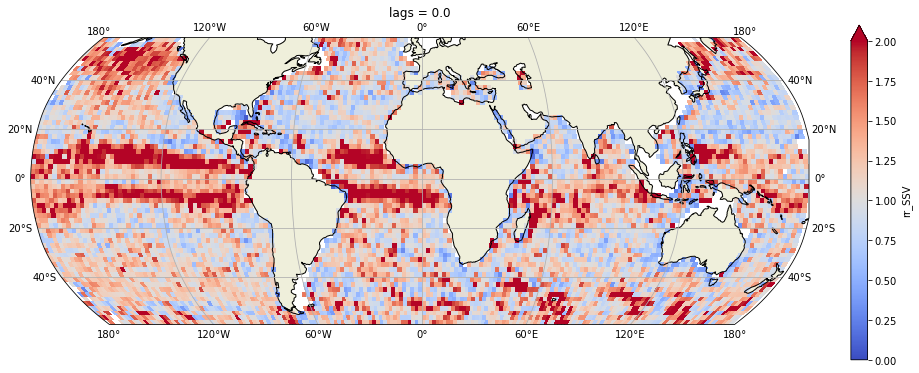

In [13]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low.rr_SSV.isel(lags=0),vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low.rr_SSV.isel(lags=0),vlim=(0,0.1),colmap=cmap)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps((dsL_low.rr_SSV/dsE_low.rr_SSV).isel(lags=0),vlim=(0,2),colmap='coolwarm')

### Visualization autocovariance

In [8]:
dsE_low = dsE_low.where(dsE_low.rr_SSU.isel(lags=0)>0)

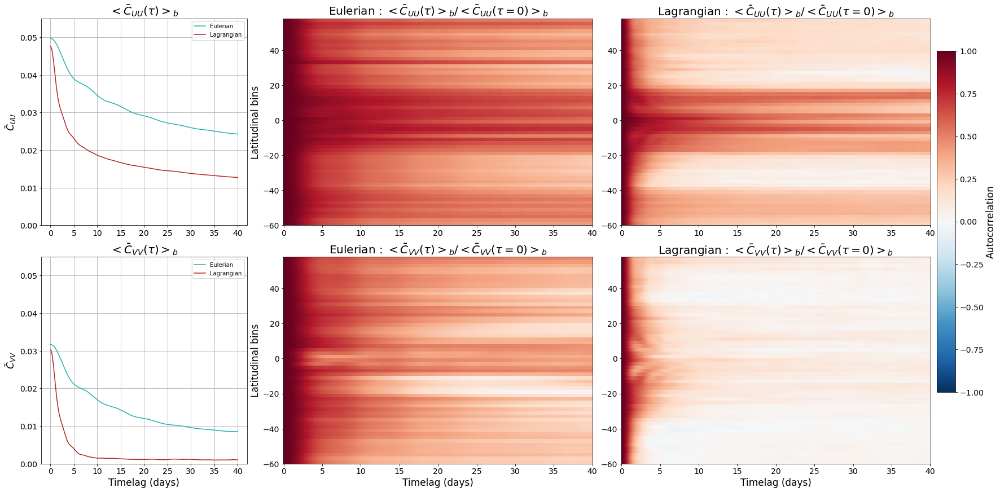

In [19]:
import matplotlib as mpl
with mpl.rc_context({'axes.titlesize': 20,'axes.labelsize':17,'xtick.labelsize':14,'ytick.labelsize':14}):
    fig = plt.figure(figsize=(23, 12), constrained_layout=True)
    spec = fig.add_gridspec(2, 8)

    for i,v in enumerate(['rr_SSU','rr_SSV']):
        ax = fig.add_subplot(spec[i, 2:5])
        comp = v[-1]
        cs = (dsE_low[v].mean('lon_bin')/dsE_low[v].mean('lon_bin').isel(lags=0)
        ).plot(cmap='RdBu_r',ax=ax,y='lat_bin',vmax=1,vmin=-1,add_colorbar=False);
        ax.set_title(r'Eulerian : $<\bar C_{%s%s}(\tau)>_b/<\bar C_{%s%s}(\tau=0)>_b$'%(v[-1],v[-1],v[-1],v[-1]));
        ax.set_ylabel('Latitudinal bins');ax.set_xlabel('')
        ax1 = fig.add_subplot(spec[i, 5:],sharex=ax)
        (dsL_low[v].mean('lon_bin')/dsL_low[v].mean('lon_bin').isel(lags=0)
        ).plot(cmap='RdBu_r',ax=ax1,y='lat_bin',vmax=1,vmin=-1,add_colorbar=False);
        ax1.set_title(r'Lagrangian : $<\bar C_{%s%s}(\tau)>_b/<\bar C_{%s%s}(\tau=0)>_b$'%(v[-1],v[-1],v[-1],v[-1]));
        ax1.set_ylabel('');ax1.set_xlabel('')
        ax2 = fig.add_subplot(spec[i, :2])
        dsE_low[v].mean(['lon_bin','lat_bin']).plot(ax=ax2,ylim=(0,0.055),c='lightseagreen',label='Eulerian');
        dsL_low[v].mean(['lon_bin','lat_bin']).plot(ax=ax2,ylim=(0,0.055),c='firebrick',label='Lagrangian');
        ax2.set_title(r'$<\bar C_{%s%s}(\tau)>_b$'%(v[-1],v[-1]));
        ax2.set_ylabel(r'$\bar C_{%s%s}$'%(v[-1],v[-1]));
        ax2.grid();ax2.legend();ax2.set_xlabel('')
    ax1.set_xlabel('Timelag (days)');ax.set_xlabel('Timelag (days)');ax2.set_xlabel('Timelag (days)')
    cbar_ax = fig.add_axes([1., 0.2, 0.02, 0.7])
    cb = fig.colorbar(cs, cax=cbar_ax)#
    cb.set_label('Autocorrelation',size=17)
    #annotate_axes(ax0, 'ax0')
    fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/EL_autocov_norm_low_mean0.png')

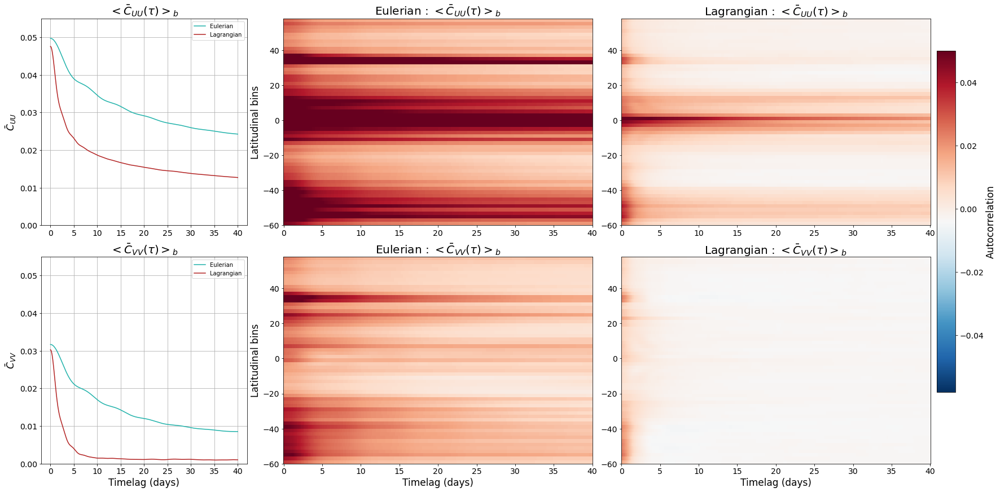

In [20]:
with mpl.rc_context({'axes.titlesize': 20,'axes.labelsize':17,'xtick.labelsize':14,'ytick.labelsize':14}):
    fig = plt.figure(figsize=(23, 12), constrained_layout=True)
    spec = fig.add_gridspec(2, 8)

    for i,v in enumerate(['rr_SSU','rr_SSV']):
        ax = fig.add_subplot(spec[i, 2:5])
        comp = v[-1]
        cs = (dsE_low[v].mean('lon_bin')).plot(cmap='RdBu_r',ax=ax,y='lat_bin',
                                               vmax=0.05,vmin=-0.058,add_colorbar=False);
        ax.set_title(r'Eulerian : $<\bar C_{%s%s}(\tau)>_b$'%(v[-1],v[-1]));
        ax.set_ylabel('Latitudinal bins');ax.set_xlabel('')
        ax1 = fig.add_subplot(spec[i, 5:],sharex=ax)
        (dsL_low[v].mean('lon_bin')).plot(cmap='RdBu_r',ax=ax1,y='lat_bin',
                                          vmax=0.1,vmin=-0.1,add_colorbar=False);
        ax1.set_title(r'Lagrangian : $<\bar C_{%s%s}(\tau)>_b$'%(v[-1],v[-1]));
        ax1.set_ylabel('');ax1.set_xlabel('')
        ax2 = fig.add_subplot(spec[i, :2])
        dsE_low[v].mean(['lon_bin','lat_bin']).plot(ax=ax2,ylim=(0,0.055),c='lightseagreen',label='Eulerian');
        dsL_low[v].mean(['lon_bin','lat_bin']).plot(ax=ax2,ylim=(0,0.055),c='firebrick',label='Lagrangian');
        ax2.set_title(r'$<\bar C_{%s%s}(\tau)>_b$'%(v[-1],v[-1]));
        ax2.set_ylabel(r'$\bar C_{%s%s}$'%(v[-1],v[-1]));
        ax2.grid();ax2.legend();ax2.set_xlabel('')
    ax1.set_xlabel('Timelag (days)');ax.set_xlabel('Timelag (days)');ax2.set_xlabel('Timelag (days)')
    cbar_ax = fig.add_axes([1., 0.2, 0.02, 0.7])
    cb = fig.colorbar(cs, cax=cbar_ax)#
    cb.set_label('Autocorrelation',size=17)
    #annotate_axes(ax0, 'ax0')
    fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/EL_autocov_low_mean0.png')

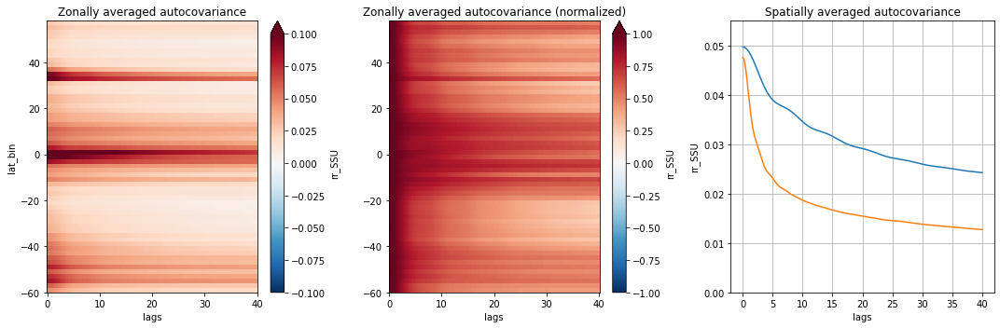

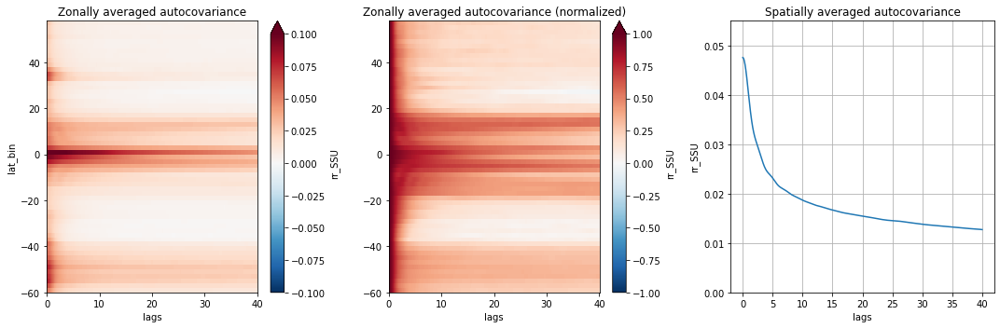

In [18]:
fig,axs = plt.subplots(1,3,figsize=(15,5))
dsE_low.rr_SSU.mean('lon_bin').plot(cmap='RdBu_r',ax=axs[0],y='lat_bin',vmax=0.1,vmin=-0.1,);axs[0].set_title('Zonally averaged autocovariance')
(dsE_low.rr_SSU.mean('lon_bin')/dsE_low.rr_SSU.mean('lon_bin').isel(lags=0)).plot(cmap='RdBu_r',ax=axs[1],y='lat_bin',vmax=1,vmin=-1);
axs[1].set_title('Zonally averaged autocovariance (normalized)')
dsE_low.rr_SSU.mean(['lon_bin','lat_bin']).plot(ax=axs[2],ylim=(0,0.055));
#dsL_80.rr.mean(['lon_bins','lat_bins']).plot(ax=axs[2],xlim=(0,40));
axs[2].set_title('Spatially averaged autocovariance')
axs[1].set_ylabel('')
axs[2].grid();
fig.tight_layout()
#fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_autocov_low_mean0.png')


fig,axs = plt.subplots(1,3,figsize=(15,5))
dsL_low.rr_SSU.mean('lon_bin').plot(cmap='RdBu_r',ax=axs[0],vmax=0.1,vmin=-0.1);axs[0].set_title('Zonally averaged autocovariance')
(dsL_low.rr_SSU.mean('lon_bin')/dsL_low.rr_SSU.mean('lon_bin').isel(lags=0)).plot(cmap='RdBu_r',ax=axs[1],vmax=1,vmin=-1);
axs[1].set_title('Zonally averaged autocovariance (normalized)')
dsL_low.rr_SSU.mean(['lon_bin','lat_bin']).plot(ax=axs[2],ylim=(0,0.055));
axs[2].set_title('Spatially averaged autocovariance')
axs[1].set_ylabel('')
axs[2].grid();
fig.tight_layout()
#fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_autocov_low_mean0.png')

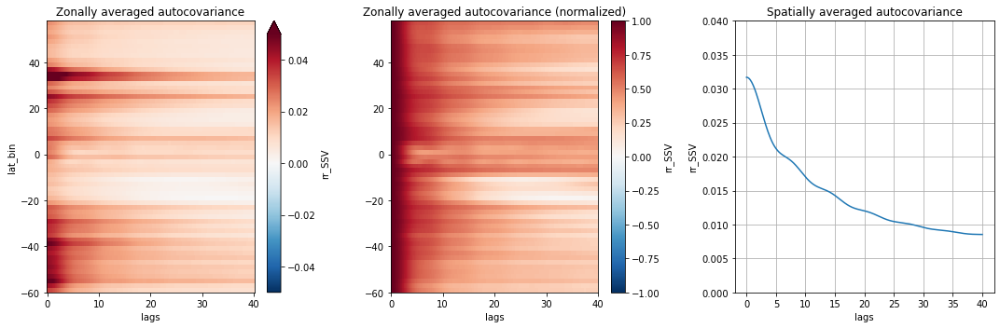

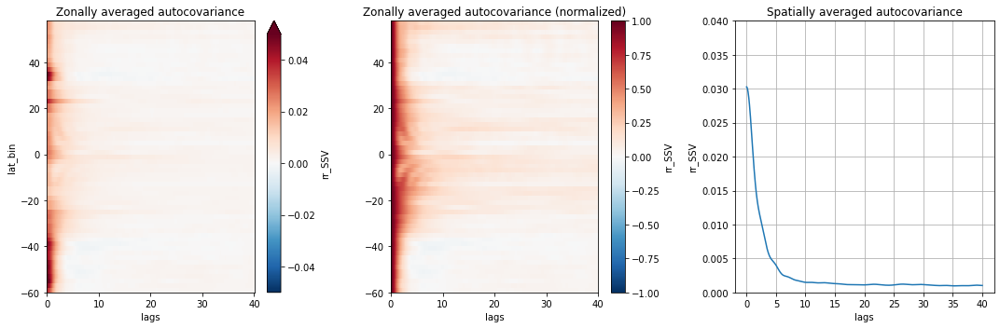

In [97]:
fig,axs = plt.subplots(1,3,figsize=(15,5))
dsE_low.rr_SSV.mean('lon_bin').plot(cmap='RdBu_r',ax=axs[0],y='lat_bin',vmax=0.05,vmin=-0.05);
axs[0].set_title('Zonally averaged autocovariance');
(dsE_low.rr_SSV.mean('lon_bin')/dsE_low.rr_SSV.mean('lon_bin').isel(lags=0)
).plot(cmap='RdBu_r',ax=axs[1],y='lat_bin',vmax=1,vmin=-1);
axs[1].set_title('Zonally averaged autocovariance (normalized)')
dsE_low.rr_SSV.mean(['lon_bin','lat_bin']).plot(ax=axs[2],ylim=(0,0.04));
#dsL_80.rr.mean(['lon_bins','lat_bins']).plot(ax=axs[2],xlim=(0,40));
axs[2].set_title('Spatially averaged autocovariance')
axs[1].set_ylabel('')
axs[2].grid();
fig.tight_layout()

fig,axs = plt.subplots(1,3,figsize=(15,5))
dsL_low.rr_SSV.mean('lon_bin').plot(cmap='RdBu_r',ax=axs[0],vmax=0.05,vmin=-0.05);
axs[0].set_title('Zonally averaged autocovariance')
(dsL_low.rr_SSV.mean('lon_bin')/dsL_low.rr_SSV.mean('lon_bin').isel(lags=0)
).plot(cmap='RdBu_r',ax=axs[1],vmax=1,vmin=-1);
axs[1].set_title('Zonally averaged autocovariance (normalized)')
dsL_low.rr_SSV.mean(['lon_bin','lat_bin']).plot(ax=axs[2],ylim=(0,0.04));
axs[2].set_title('Spatially averaged autocovariance')
axs[1].set_ylabel('')
axs[2].grid();
fig.tight_layout()

### Estimation of paraeters : fit 

In [9]:
dt = 3/24 # time step in days
rad = 2*np.pi
tau = np.arange(0,dsL_low.lags.max()+dt,dt) #time lag

In [10]:
def fit_function(y,t=None,myfunc=None,first_guess='free',bounds=None,sigma=None):
    """Compute the best fit parameters found using scipy.optimize.curve_fit
        Parameters
        ----------
        y : data to fit
        t : timelag of the correlation function
        myfunc : function we want to fit to our data, y
        p0 : first guess on parameters
        bounds : bounds of the parameters to fit 
        
        Returns
        ----------
        params : parameters for which we obtain the best fit
        error : covariance of params computed in scipy.optimize.curve_fit
        yfit : best fit
        """
    sig = signature(myfunc)
    len_sig = len(sig.parameters.keys())
    try : 
        if first_guess=='lag' and sigma is None:
            _p0 = np.full(len_sig-1,1)
            _p0[-1] = y[0]
            params,cov = scipy.optimize.curve_fit(myfunc,t,y,p0=_p0,bounds=bounds,maxfev=1000)
    #    try:
        if sigma is not None:
            if first_guess=='lag':
                _p0 = np.full(len_sig-1,1)
                _p0[-1] = y[0]
                params,cov = scipy.optimize.curve_fit(myfunc,t,y,p0=_p0,bounds=bounds,maxfev=1000,
                                                  sigma=sigma,absolute_sigma=True)
            else:
                params,cov = scipy.optimize.curve_fit(myfunc,t,y,bounds=bounds,maxfev=1000,
                                                  sigma=sigma,absolute_sigma=True)
        else:
            params,cov = scipy.optimize.curve_fit(myfunc,t,y,bounds=bounds,maxfev=1000)
        yfit = myfunc(t,*[p for p in params])
        error=np.sqrt(np.diag(cov))
    except:
        params,error = np.full(len_sig-1,np.nan),np.full(len_sig-1,np.nan)
        yfit = np.full_like(t,np.nan)
#        out = xr.Dataset({'params':(['lat_bins','lon_bins','param'],np.expand_dims(params, axis=0)),
#                      'fitted':(['lat_bins','lon_bins','lags'],np.expand_dims(yfit,axis=0)),
#                     'error' : (['lat_bins','lon_bins','param'],np.expand_dims(cov,axis=0))},
 #                    coords={'lat_bins':np.array([y.lat_bins.values]),'lon_bins':np.array([y.lon_bins.values])
 #                            ,'param':[V for V in sig.parameters.keys()][1:],
 #                            'lags':y.lags.values})
    return params,error,yfit
def wrapper(ds,v,myfunc,t,bounds,p0='free',sigma=None):
    sig = signature(myfunc)
    params_name = [V for V in sig.parameters.keys()][1:]
    kwargs={'t':t,'myfunc':myfunc,'first_guess':p0,'bounds':bounds}
    if sigma is not None:
        kwargs.update({'sigma':sigma})
        
    print('Parameters to estimate:',params_name)
    params,error,yfit = xr.apply_ufunc(fit_function,ds[v],input_core_dims=[['lags']],
                                   output_core_dims=[['param'],['param'],['lags']],
                                   vectorize=True,kwargs=kwargs)
    params = params.rename('parameters').assign_coords({'param':params_name})
    error = error.rename('error').assign_coords({'param':params_name})
    ds_out = xr.merge([params,error,yfit])
#    ds_out = ds_out.where(ds_out[v].isel(lags=0)>1e-18)
    return ds_out

In [11]:
dsL_low = dsL_low.isel(lags=slice(0,None,3))

In [12]:
sigma = np.ones(tau.size)
sigma[:int(20/dt)] = 0.5

In [15]:
dsE_low_out = wrapper(dsE_low,'rr_SSU',y_fit_low_v1,tau,sigma=sigma,bounds=([1,0],[1000,np.inf]))
dsL_low_out = wrapper(dsL_low,'rr_SSU',y_fit_low_v1,tau,sigma=sigma,bounds=([1,0],[1000,np.inf]))

Parameters to estimate: ['T', 'V']
Parameters to estimate: ['T', 'V']


In [16]:
_dsE_low_out = wrapper(dsE_low,'rr_SSV',y_fit_low_v1,tau,sigma=sigma,bounds=([1,0,0],[1000,np.inf]))
_dsL_low_out = wrapper(dsL_low,'rr_SSV',y_fit_low_v1,tau,sigma=sigma,bounds=([1,0,0],[1000,np.inf]))

Parameters to estimate: ['T', 'V']
Parameters to estimate: ['T', 'V']


In [17]:
_dsE_low_out = _dsE_low_out.rename({'parameters':'parameters_SSV','error':'error_SSV'})
dsE_low_out = dsE_low_out.rename({'parameters':'parameters_SSU','error':'error_SSU'})

In [18]:
dsE_low_out = xr.merge([dsE_low_out,_dsE_low_out])
dsE_low_out

<xarray.Dataset>
Dimensions:         (lon_bin: 179, lat_bin: 59, param: 2, lags: 321)
Coordinates:
  * lon_bin         (lon_bin) float64 -179.0 -177.0 -175.0 ... 173.0 175.0 177.0
  * lat_bin         (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 53.0 55.0 57.0
  * param           (param) <U1 'T' 'V'
  * lags            (lags) float64 0.0 0.125 0.25 0.375 ... 39.75 39.88 40.0
Data variables:
    parameters_SSU  (lon_bin, lat_bin, param) float64 75.29 0.05167 ... 0.006814
    error_SSU       (lon_bin, lat_bin, param) float64 519.9 0.06924 ... 0.0951
    rr_SSU          (lon_bin, lat_bin, lags) float64 0.05167 ... 0.0006786
    parameters_SSV  (lon_bin, lat_bin, param) float64 nan nan nan ... nan nan
    error_SSV       (lon_bin, lat_bin, param) float64 nan nan nan ... nan nan
    rr_SSV          (lon_bin, lat_bin, lags) float64 nan nan nan ... nan nan nan

In [19]:
_dsL_low_out = _dsL_low_out.rename({'parameters':'parameters_SSV','error':'error_SSV'})
dsL_low_out = dsL_low_out.rename({'parameters':'parameters_SSU','error':'error_SSU'})
dsL_low_out = xr.merge([dsL_low_out,_dsL_low_out])

In [20]:
dsE_low_out.to_netcdf('/Users/zcaspar/codes/mit4320/E_low_fit_mean0_v1.nc')
dsL_low_out.to_netcdf('/Users/zcaspar/codes/mit4320/L_low_fit_mean0_v1.nc')

In [19]:
def y_fit_low_v1(tau,T,V):
    return V*np.exp(-tau/T)

In [20]:
dsE_low_out_v1 = wrapper(dsE_low,'rr_SSU',y_fit_low_v1,tau,sigma=sigma,bounds=([1,0],[1000,np.inf]))
dsL_low_out_v1 = wrapper(dsL_low,'rr_SSU',y_fit_low_v1,tau,sigma=sigma,bounds=([1,0],[1000,np.inf]))

Parameters to estimate: ['T', 'V']
Parameters to estimate: ['T', 'V']


In [21]:
_dsE_low_out_v1 = wrapper(dsE_low,'rr_SSV',y_fit_low_v1,tau,sigma=sigma,bounds=([1,0],[1000,np.inf]))
_dsL_low_out_v1 = wrapper(dsL_low,'rr_SSV',y_fit_low_v1,tau,sigma=sigma,bounds=([1,0],[1000,np.inf]))

Parameters to estimate: ['T', 'V']
Parameters to estimate: ['T', 'V']


In [22]:
dsE_low_out_v1 = xr.merge([dsE_low_out_v1,_dsE_low_out_v1.rr_SSV])
dsL_low_out_v1 = xr.merge([dsL_low_out_v1,_dsL_low_out_v1.rr_SSV])

#### Variance

In [23]:
cmap='OrRd'

Text(0.5, 1.0, 'Estimated Lagrangian variance (2°x2° bins)')

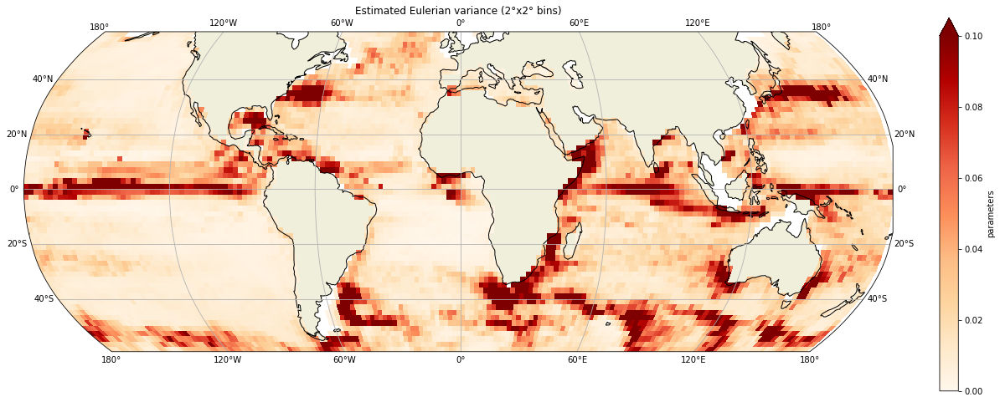

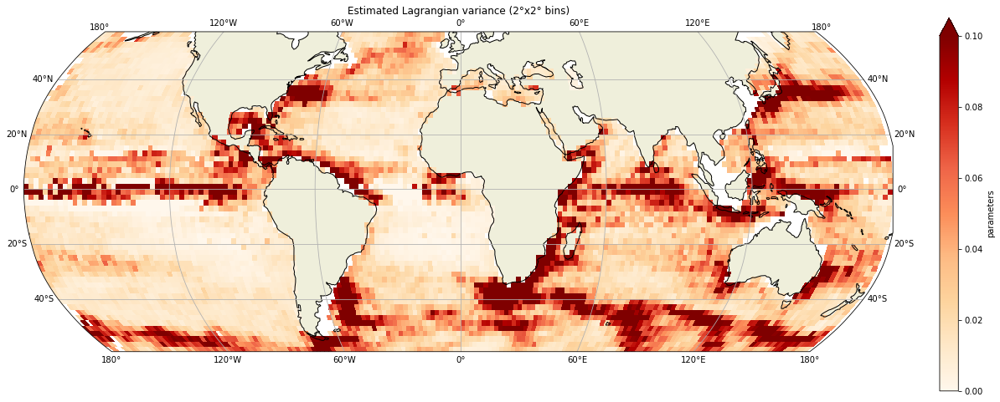

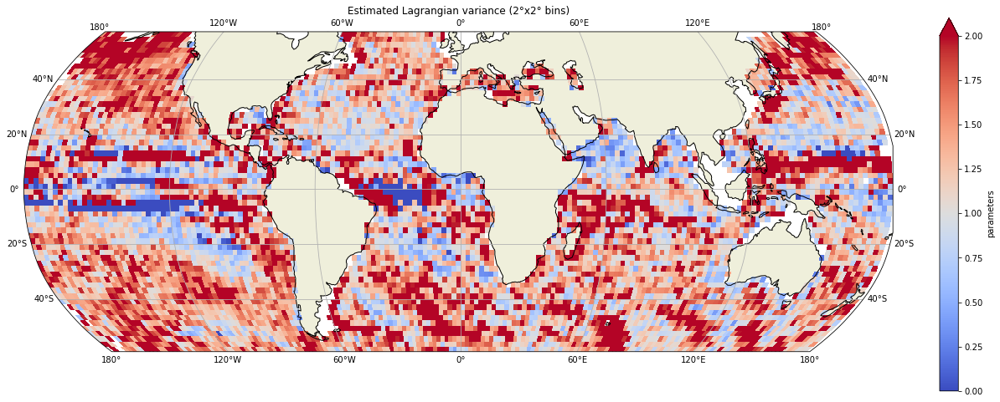

In [24]:
figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low_out.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Eulerian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'V').parameters/dsE_low_out.sel(param = 'V').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

Text(0.5, 1.0, 'Estimated Lagrangian variance (2°x2° bins)')

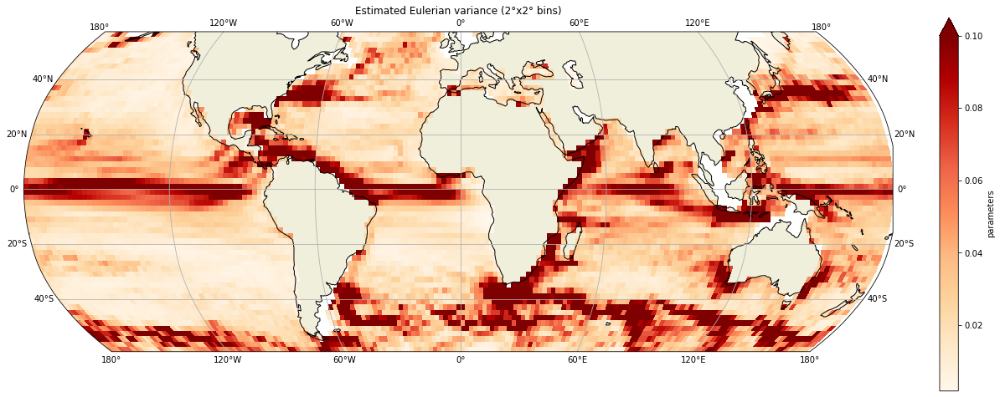

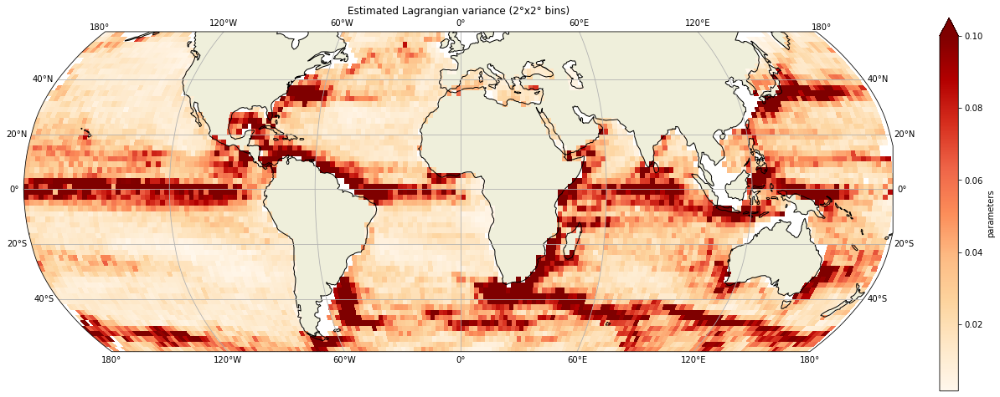

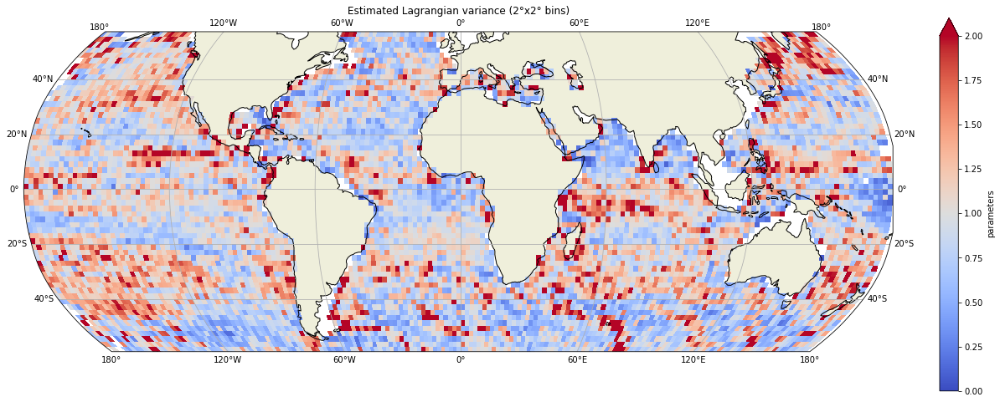

In [25]:
figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low_out_v1.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Eulerian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out_v1.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out_v1.sel(param = 'V').parameters/dsE_low_out_v1.sel(param = 'V').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

#### Notes

Lagrangian energy exhibits a lot of noise. This is due to the mean position used for the autocovariance. The drifters travel a lot more than 2° in a time period of 40 days in energetic areas.

Text(0.5, 1.0, 'Estimated Lagrangian variance (2°x2° bins)')

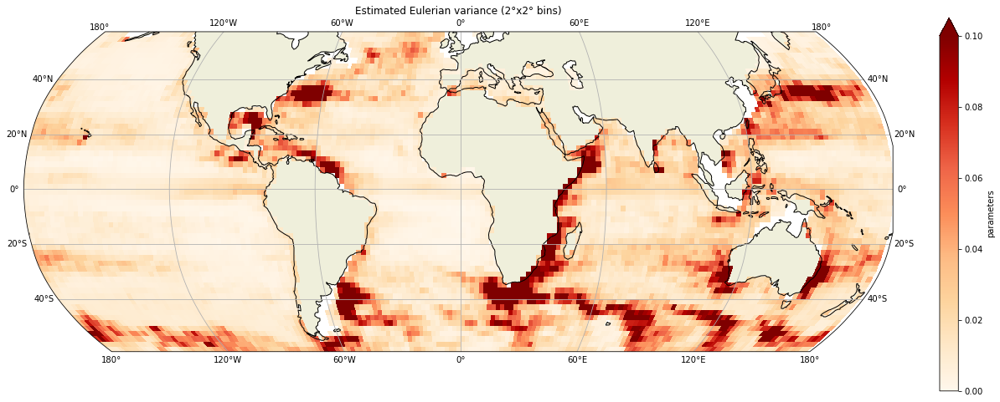

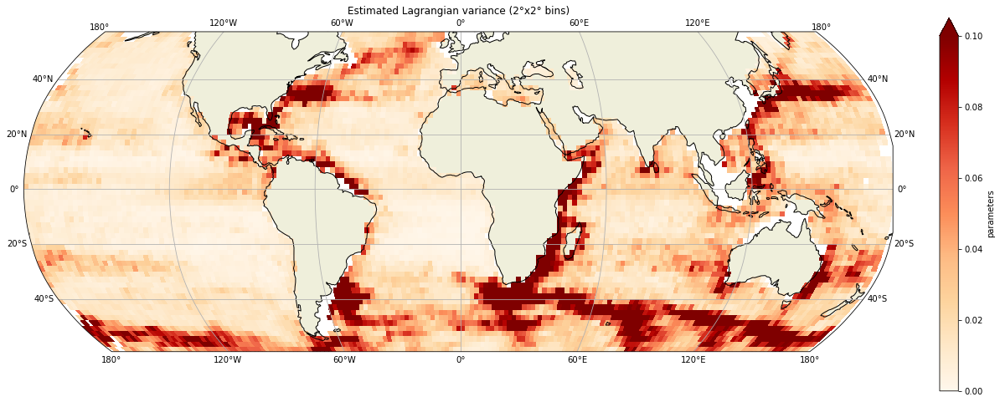

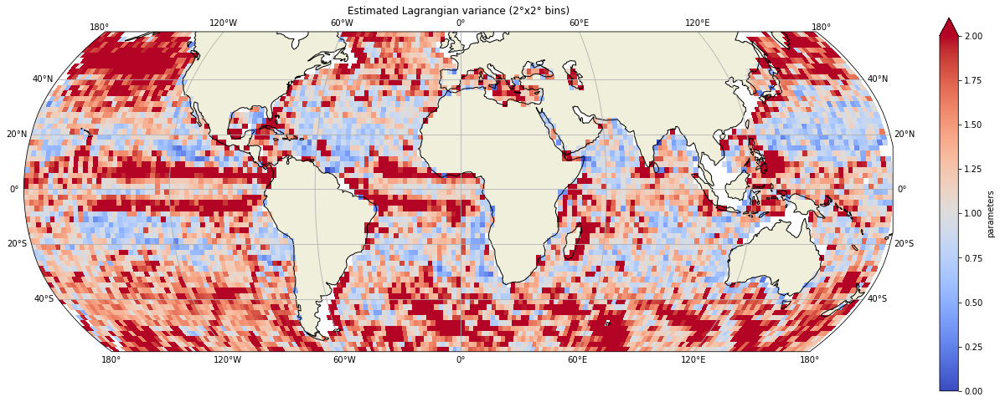

In [26]:
figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsE_low_out.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Eulerian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'V').parameters/_dsE_low_out.sel(param = 'V').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

Text(0.5, 1.0, 'Estimated Lagrangian variance (2°x2° bins)')

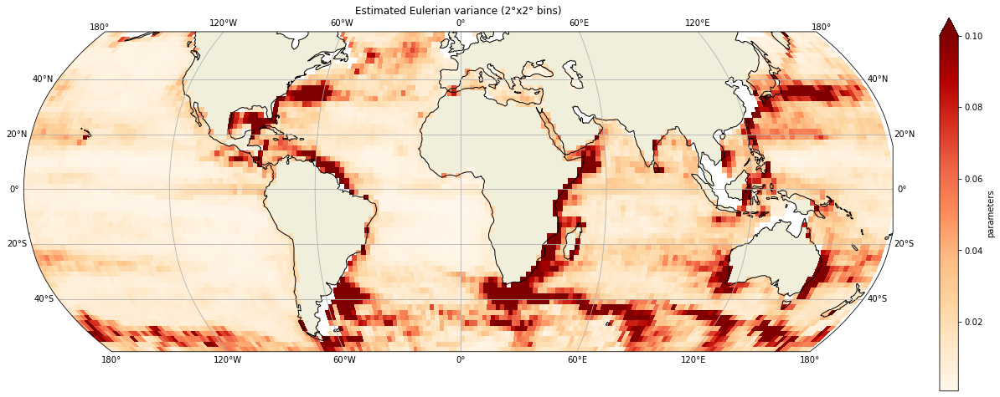

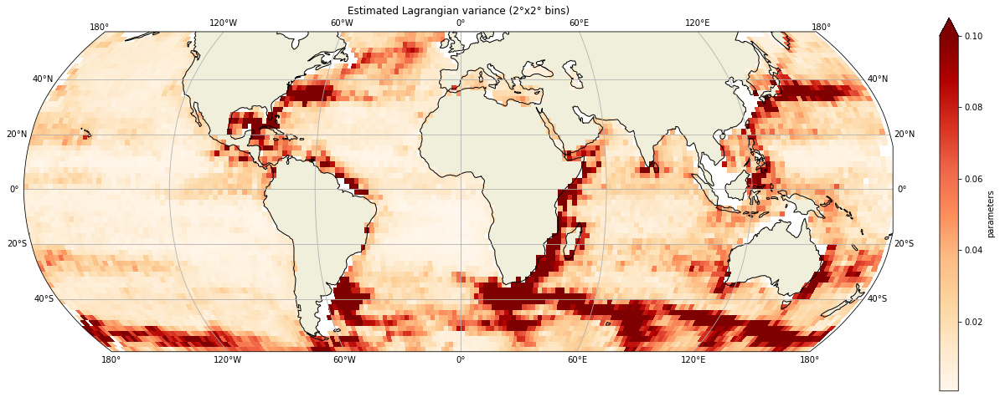

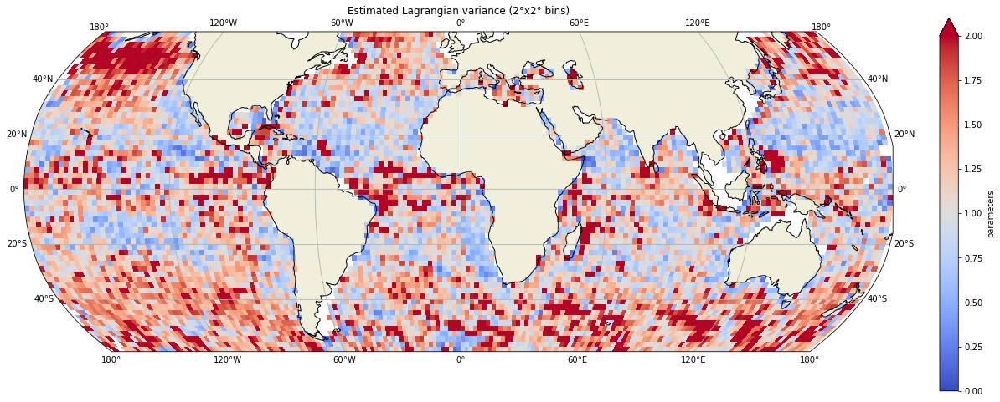

In [27]:
figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsE_low_out_v1.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Eulerian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out_v1.sel(param = 'V').parameters,colmap=cmap,vlim=(None,0.1))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

figsize = (20,20)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out_v1.sel(param = 'V').parameters/_dsE_low_out_v1.sel(param = 'V').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title('Estimated Lagrangian variance (2°x2° bins)')

#### Decorrelation timescale

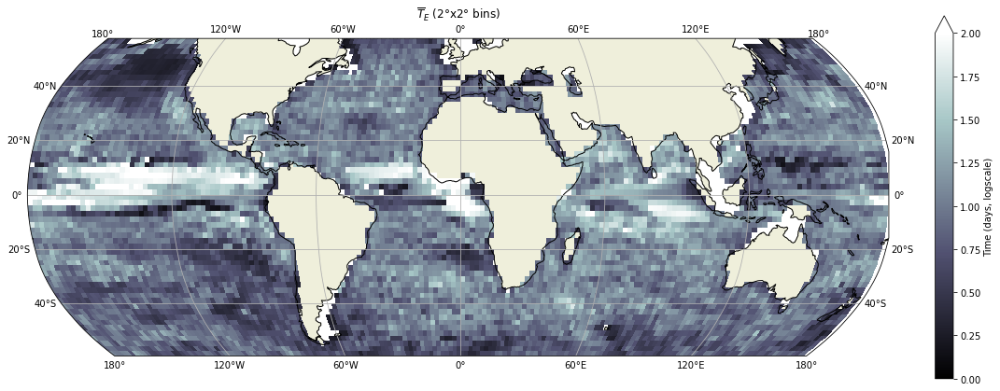

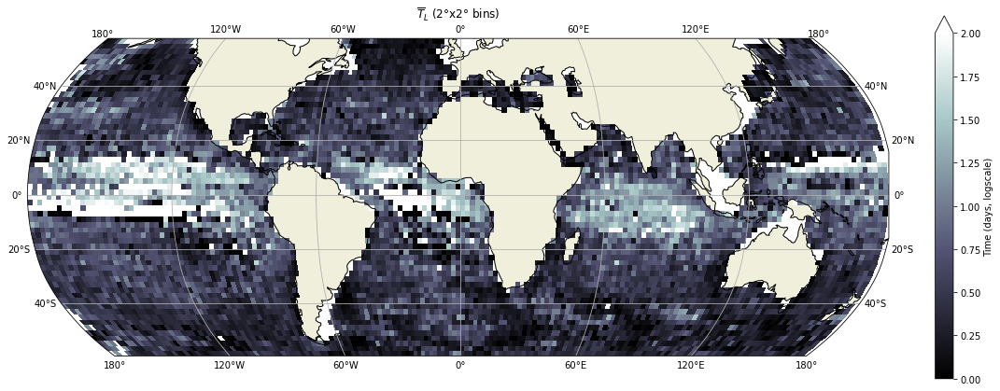

In [28]:
figsize = (15,6)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(dsE_low_out.sel(param = 'T').parameters),colmap='bone',vlim=(0,2),
                   label='Time (days, logscale)')
ax.set_title(r'$\overline{T}_E$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_Tbar_mean0_log.png',bbox_inches='tight')


fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(dsL_low_out.sel(param = 'T').parameters),colmap='bone',vlim=(0,2),
                  label='Time (days, logscale)')
ax.set_title(r'$\overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tbar_mean0_log.png',bbox_inches='tight')



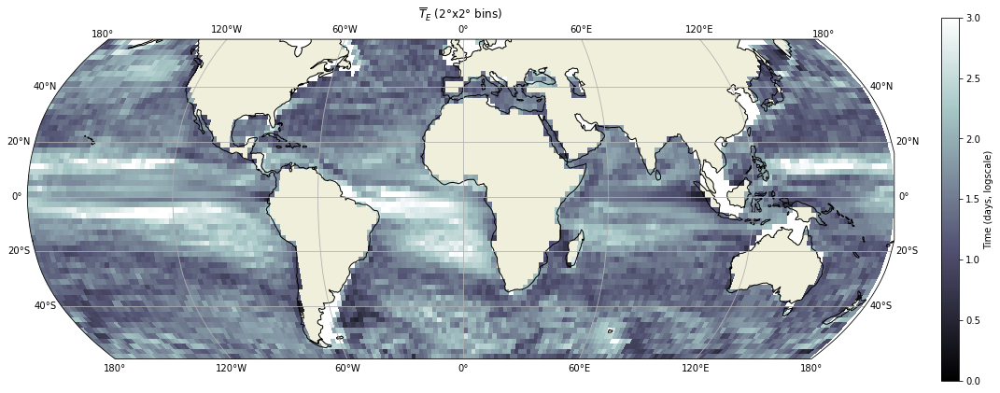

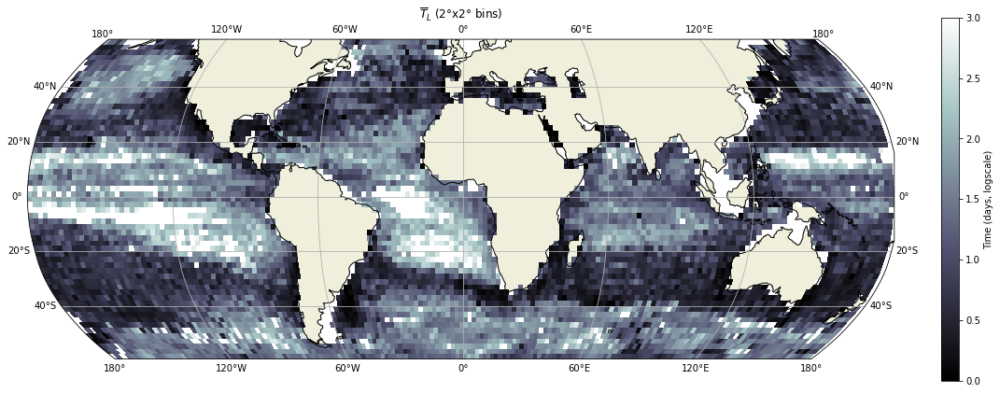

In [29]:
figsize = (15,6)

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(dsE_low_out_v1.sel(param = 'T').parameters),colmap='bone',vlim=(0,3),
                   label='Time (days, logscale)')
ax.set_title(r'$\overline{T}_E$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_Tbar_mean0_log_v1.png',bbox_inches='tight')


fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(dsL_low_out_v1.sel(param = 'T').parameters),colmap='bone',vlim=(0,3),
                  label='Time (days, logscale)')
ax.set_title(r'$\overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tbar_mean0_log_v1.png',bbox_inches='tight')

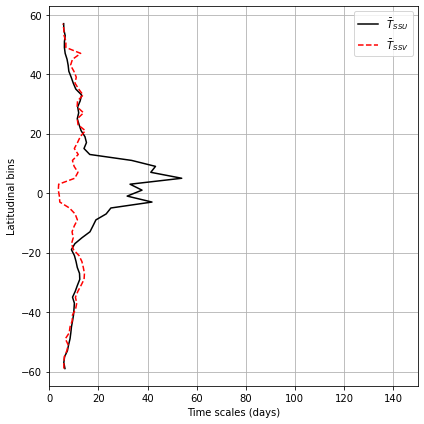

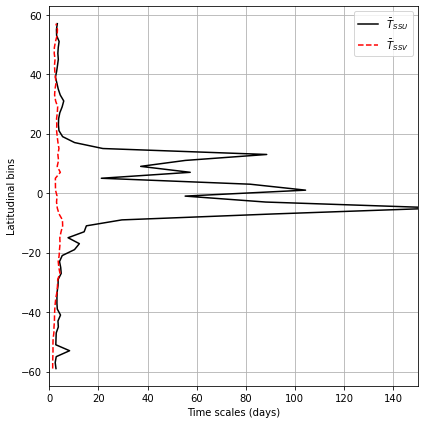

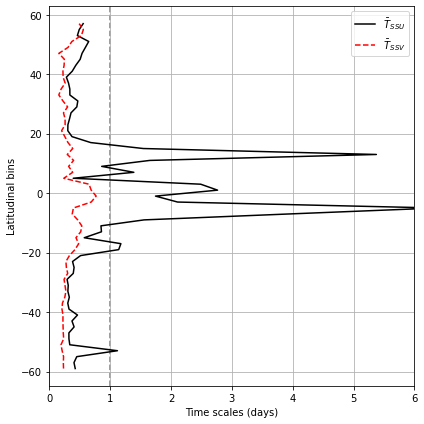

In [36]:
fig,ax = plt.subplots(figsize=(6,6))
dsE_low_out.sel(param='T').parameters.mean('lon_bin').plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSU}$',c='k')
_dsE_low_out.sel(param='T').parameters.mean('lon_bin').plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSV}$',
                                                            c='r',linestyle='--')
ax.grid();ax.set_ylabel('Latitudinal bins'); ax.set_xlabel('Time scales (days)');
ax.set_title('');ax.legend();ax.set_xlim(0,150)
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_Tbar_lat_mean0.png',bbox_inches='tight')

fig,ax = plt.subplots(figsize=(6,6))
dsL_low_out.sel(param='T').parameters.mean('lon_bin').plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSU}$',c='k')
_dsL_low_out.sel(param='T').parameters.mean('lon_bin').plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSV}$',
                                                           c='r',linestyle='--')
ax.grid();ax.set_ylabel('Latitudinal bins'); ax.set_xlabel('Time scales (days)');
ax.set_title('');ax.legend();ax.set_xlim(0,150)
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tbar_lat_mean0.png',bbox_inches='tight')

fig,ax = plt.subplots(figsize=(6,6))
(dsL_low_out.sel(param='T').parameters.mean('lon_bin')/dsE_low_out.sel(param='T').parameters.mean('lon_bin')
).plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSU}$',c='k')
(_dsL_low_out.sel(param='T').parameters.mean('lon_bin')/_dsE_low_out.sel(param='T').parameters.mean('lon_bin')
).plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSV}$',
                                                           c='r',linestyle='--')
ax.grid();ax.set_ylabel('Latitudinal bins'); ax.set_xlabel('Time scales (days)');
ax.set_title('');ax.legend();ax.set_xlim(0,6);ax.axvline(1,c='grey',linestyle='--',zorder=-1)
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/LE_Tbar_lat_mean0.png',bbox_inches="tight")

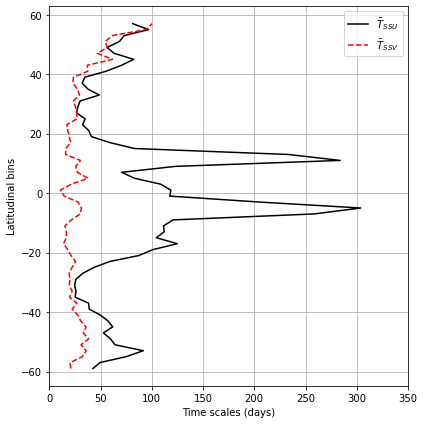

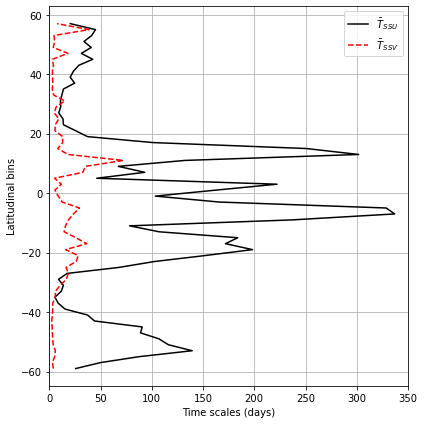

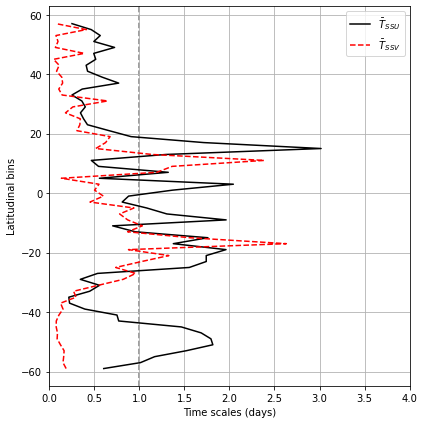

In [35]:
fig,ax = plt.subplots(figsize=(6,6))
dsE_low_out_v1.sel(param='T').parameters.mean('lon_bin').plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSU}$',c='k')
_dsE_low_out_v1.sel(param='T').parameters.mean('lon_bin').plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSV}$',
                                                            c='r',linestyle='--')
ax.grid();ax.set_ylabel('Latitudinal bins'); ax.set_xlabel('Time scales (days)');
ax.set_title('');ax.legend();ax.set_xlim(0,350)
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_Tbar_lat_mean0_v1.png',bbox_inches="tight")

fig,ax = plt.subplots(figsize=(6,6))
dsL_low_out_v1.sel(param='T').parameters.mean('lon_bin').plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSU}$',c='k')
_dsL_low_out_v1.sel(param='T').parameters.mean('lon_bin').plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSV}$',
                                                           c='r',linestyle='--')
ax.grid();ax.set_ylabel('Latitudinal bins'); ax.set_xlabel('Time scales (days)');
ax.set_title('');ax.legend();ax.set_xlim(0,350)
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tbar_lat_mean0_v1.png',bbox_inches="tight")

fig,ax = plt.subplots(figsize=(6,6))
(dsL_low_out_v1.sel(param='T').parameters.mean('lon_bin')/dsE_low_out_v1.sel(param='T').parameters.mean('lon_bin')
).plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSU}$',c='k')
(_dsL_low_out_v1.sel(param='T').parameters.mean('lon_bin')/_dsE_low_out_v1.sel(param='T').parameters.mean('lon_bin')
).plot(ax=ax,y='lat_bin',label=r'$\bar T_{SSV}$',
                                                           c='r',linestyle='--')
ax.grid();ax.set_ylabel('Latitudinal bins'); ax.set_xlabel('Time scales (days)');
ax.set_title('');ax.legend();ax.set_xlim(0,4);ax.axvline(1,c='grey',linestyle='--',zorder=-1)
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/LE_Tbar_lat_mean0_v1.png',bbox_inches="tight")

Text(0.5, 1.0, 'c (2°x2° bins)')

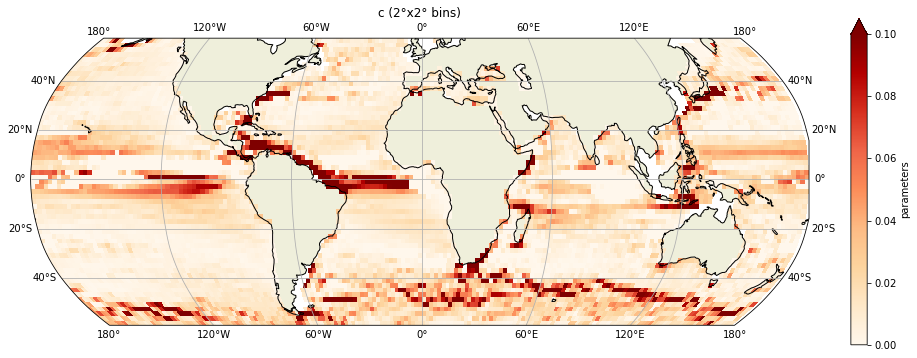

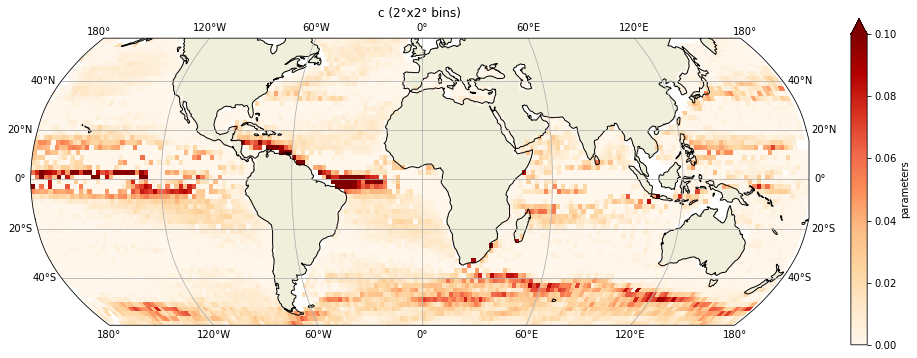

In [34]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low_out.sel(param = 'c').parameters,colmap='OrRd',vlim=(0,0.1))
ax.set_title(r'c (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'c').parameters,colmap='OrRd',vlim=(0,0.1))
ax.set_title(r'c (2°x2° bins)')

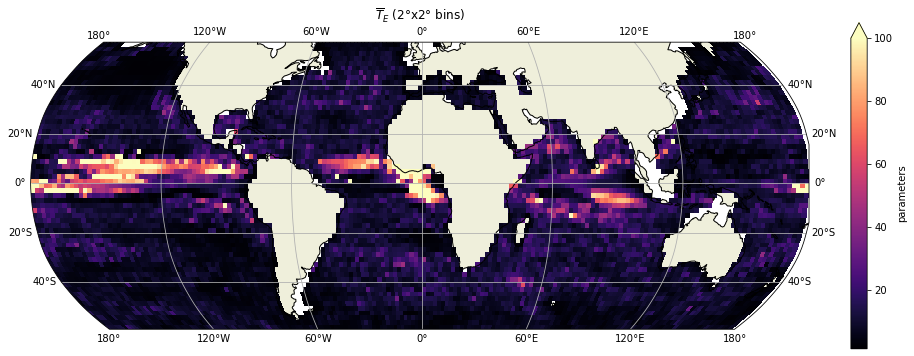

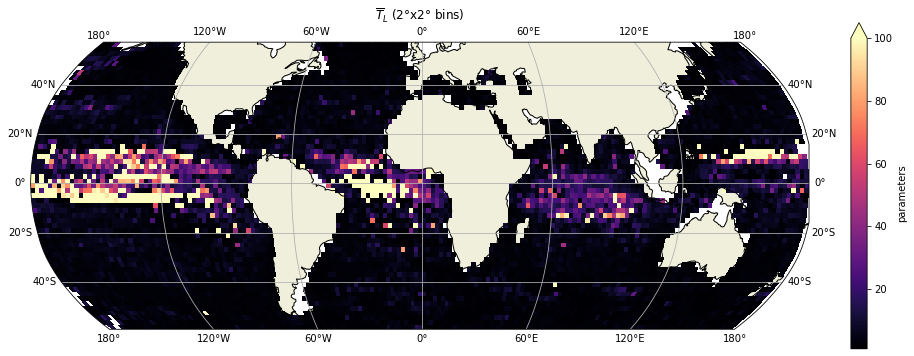

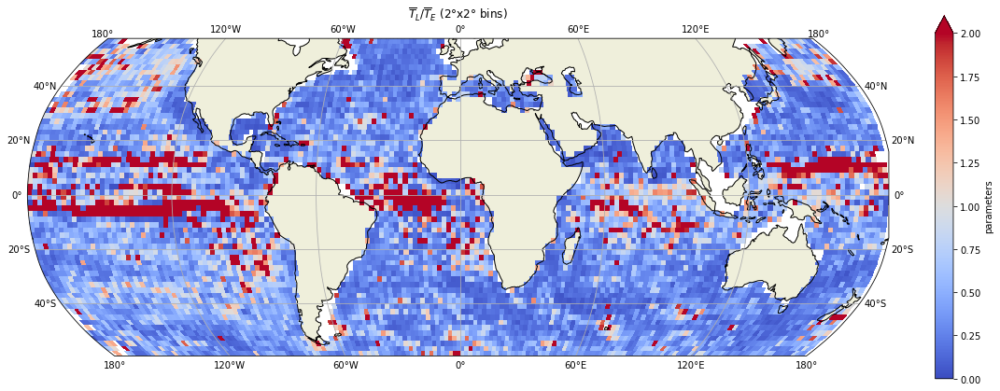

In [38]:
figsize = (15,6)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title(r'$\overline{T}_E$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_Tbar_mean0.png')


fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title(r'$\overline{T}_L$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tbar_mean0.png')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'T').parameters/dsE_low_out.sel(param = 'T').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title(r'$\overline{T}_L/\overline{T}_E$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/LE_Tbar_mean0.png',bbox_inches="tight")



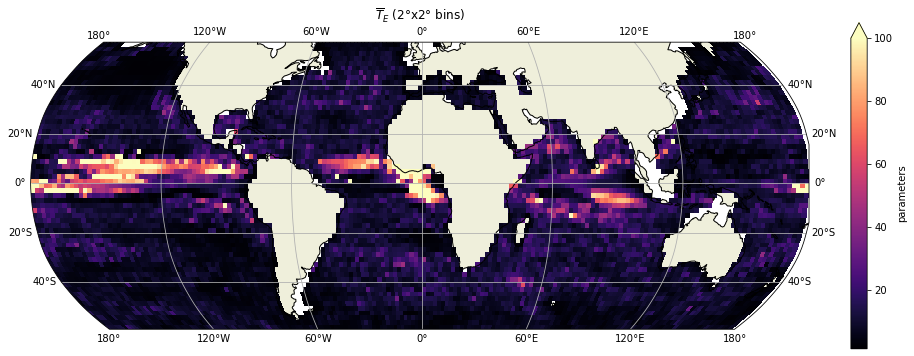

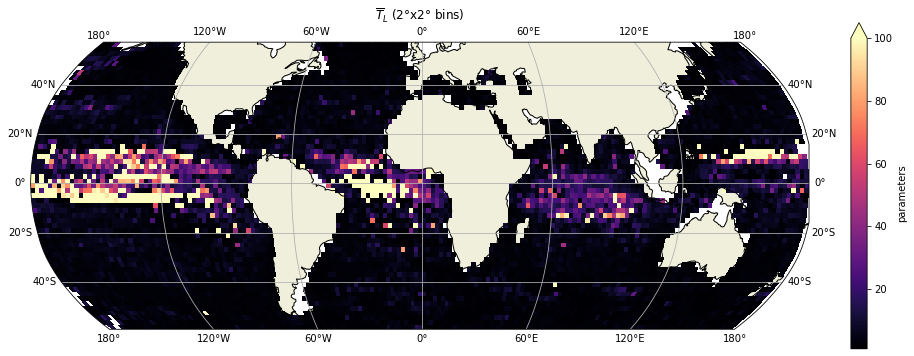

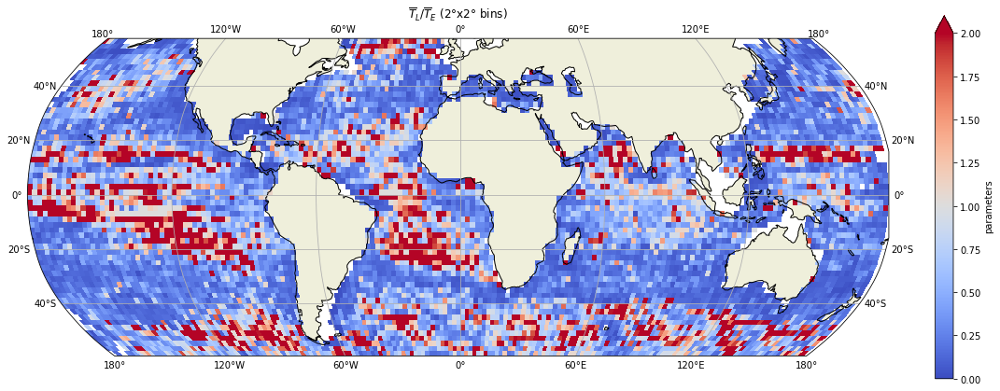

In [37]:
figsize = (15,6)
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title(r'$\overline{T}_E$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_Tbar_mean0.png')


fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title(r'$\overline{T}_L$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tbar_mean0.png')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out_v1.sel(param = 'T').parameters/dsE_low_out_v1.sel(param = 'T').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title(r'$\overline{T}_L/\overline{T}_E$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/LE_Tbar_mean0_v1.png',bbox_inches="tight")




Text(0.5, 1.0, '$\\overline{T}_L$ (2°x2° bins)')

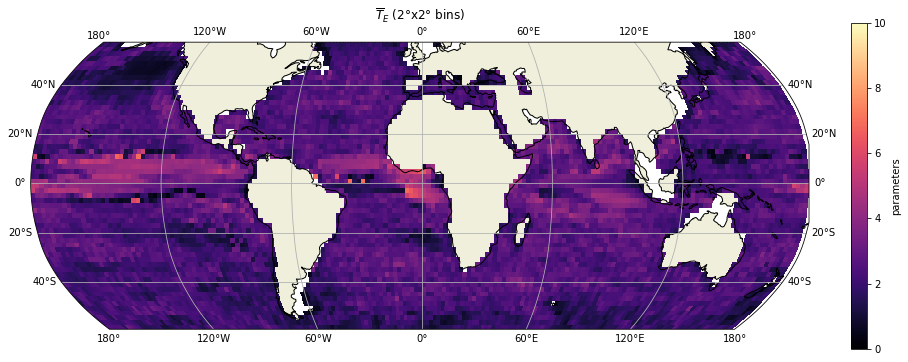

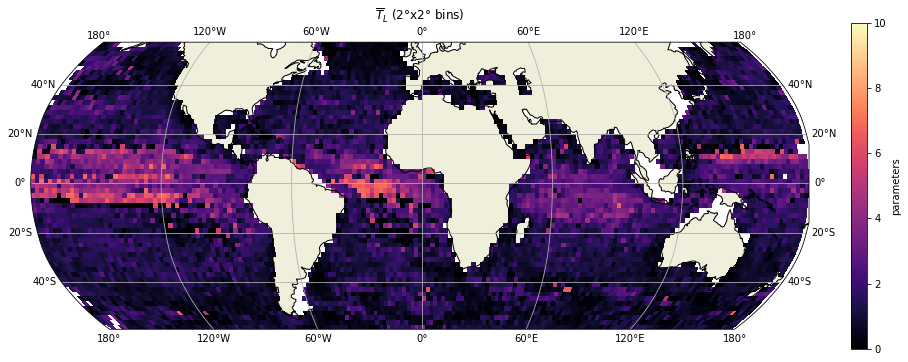

In [39]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(dsE_low_out.sel(param = 'T').parameters),colmap='magma',vlim=(0,10))
ax.set_title(r'$\overline{T}_E$ (2°x2° bins)')
#fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_Tbar_mean0.png')


fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(dsL_low_out.sel(param = 'T').parameters),colmap='magma',vlim=(0,10))
ax.set_title(r'$\overline{T}_L$ (2°x2° bins)')
#fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tbar_mean0.png')

Text(0.5, 1.0, 'Estimated Lagrangian decorrelation timescale (2°x2° bins)')

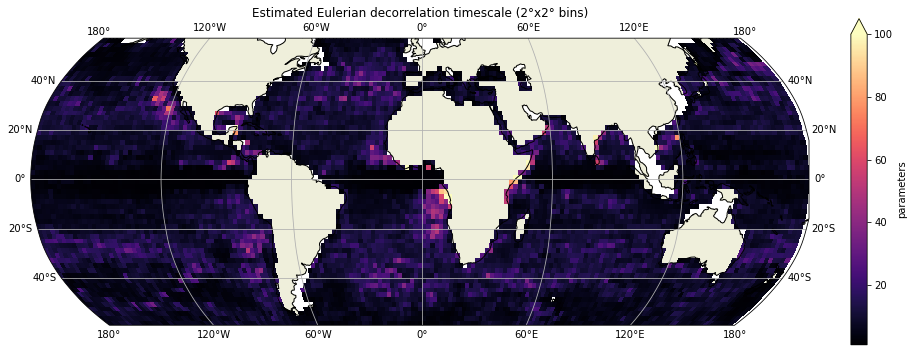

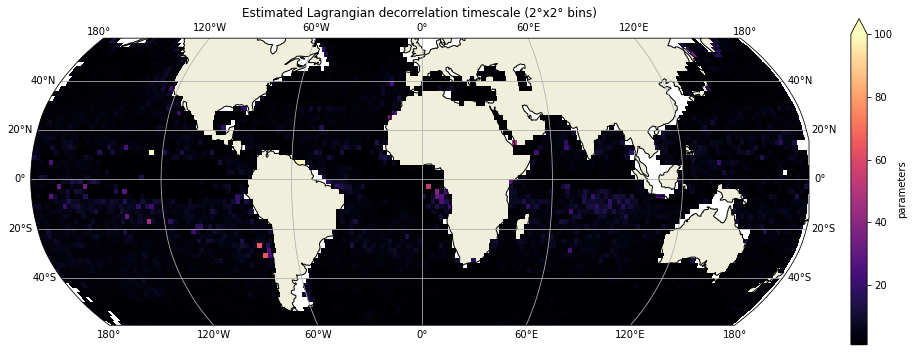

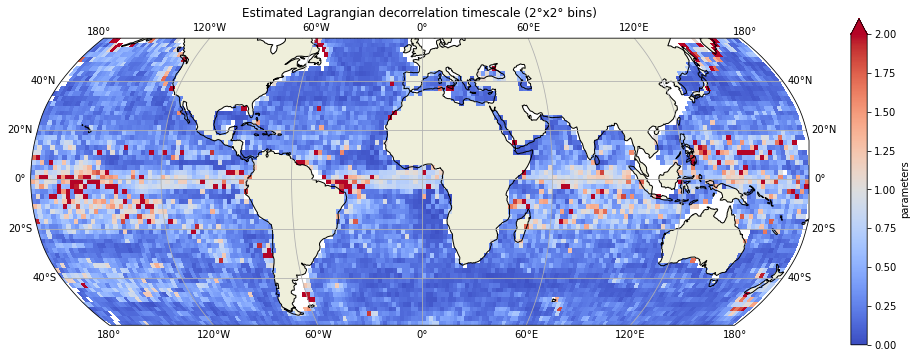

In [40]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsE_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title('Estimated Eulerian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(None,100))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'T').parameters/_dsE_low_out.sel(param = 'T').parameters,
                   colmap='coolwarm',vlim=(0,2))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

In [41]:
for V in ['rr_SSU','rr_SSV']:
    dsE_low[V+'_norm'] = dsE_low[V]/dsE_low[V].isel(lags=0)
    dsL_low[V+'_norm'] = dsL_low[V]/dsL_low[V].isel(lags=0)
    dsE_low_out[V+'_norm'] = dsE_low_out[V]/dsE_low_out[V].isel(lags=0)
    dsL_low_out[V+'_norm'] = dsL_low_out[V]/dsL_low_out[V].isel(lags=0)

In [42]:
#2 points in different areas : short E and L timescales, large E and L timescales, L << E, L>E
areas = {'South atlantic ridge' : [[-15,-5],[-15,-15],[-15,-25]],
        'Gulf stream' : [[-70,35],[-60,35]],
        'South Indian ocean' : [[58,-44],[78,-44]],
        'Pacific (equator)' : [[-100,-5],[-100,5],[-100,10]]
        }

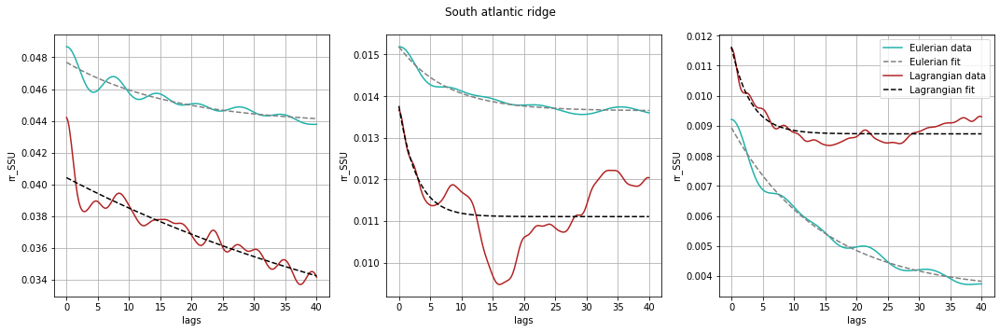

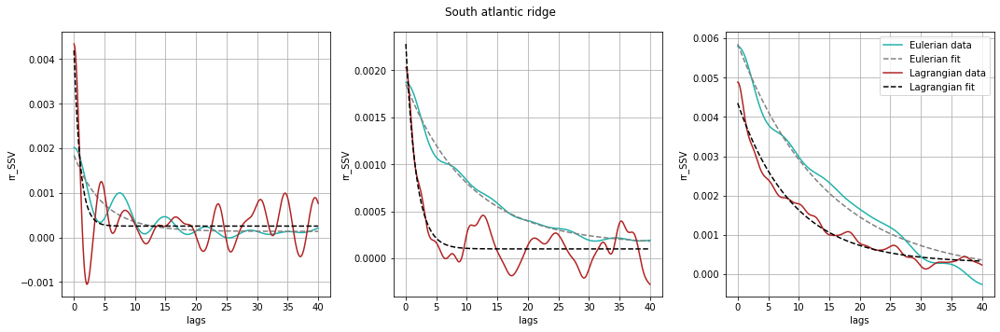

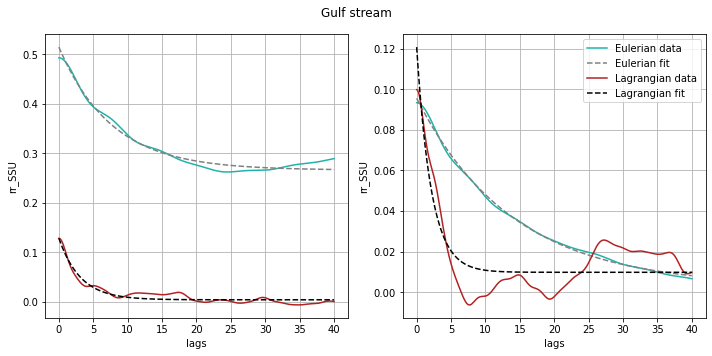

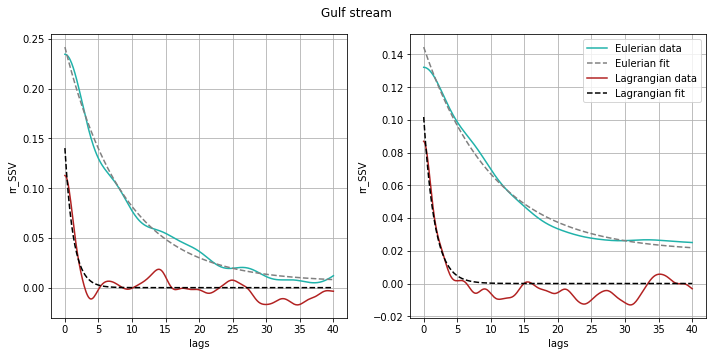

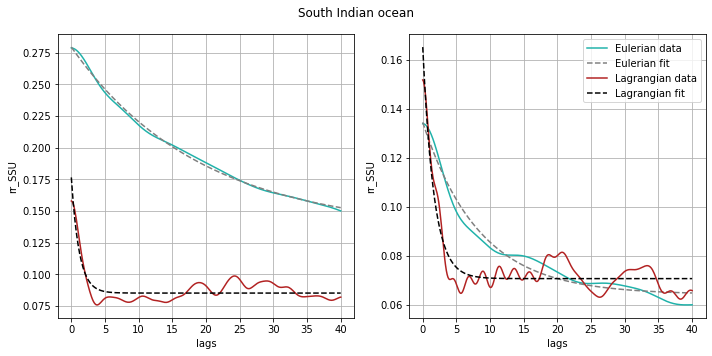

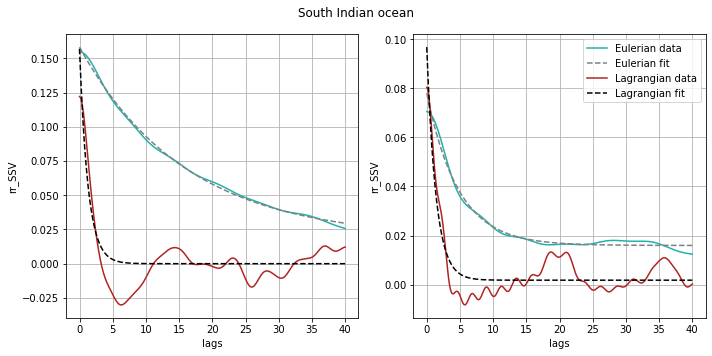

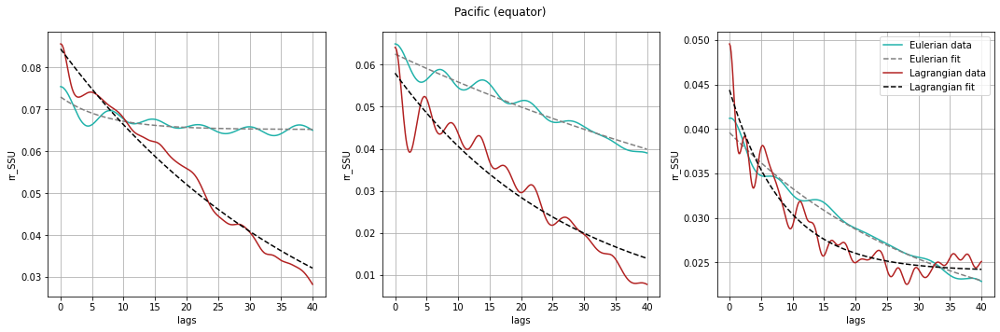

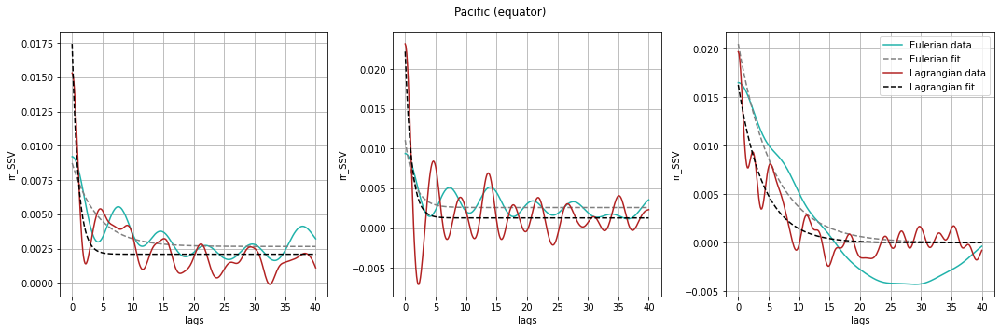

In [43]:
for k in areas.keys():
    for V in ['rr_SSU','rr_SSV']:
        fig,axs = plt.subplots(1,len(areas[k]),figsize=(5*len(areas[k]),5),sharey=False)
        for ax,pt in zip(axs,areas[k]):
            dsE_low[V].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                              ).plot(ax=ax,c='lightseagreen',label='Eulerian data');
            dsE_low_out[V].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                  ).plot(ax=ax,c='grey',linestyle='--',label='Eulerian fit');
            dsL_low[V].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                          ).plot(ax=ax,c='firebrick',label='Lagrangian data');
            dsL_low_out[V].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                              ).plot(ax=ax,c='k',linestyle='--',label='Lagrangian fit');
            ax.grid();ax.set_title('');
    #        low_var = dsE_low.rr.sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest').isel(lags=0).values
    #        ax.text(0,-0.004,r'$\overline{V}^2 \sim%s$'%np.around(low_var,decimals=4))
        ax.legend()
        fig.suptitle(k);fig.tight_layout();

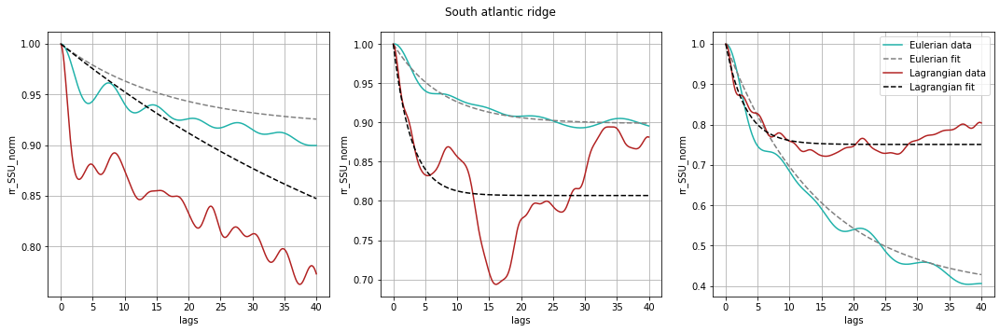

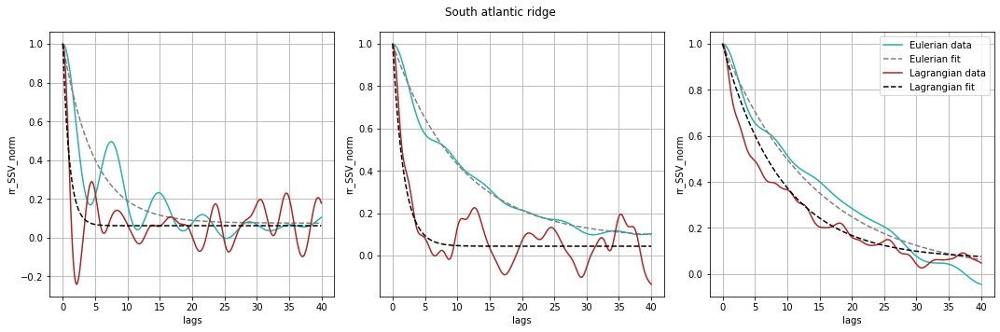

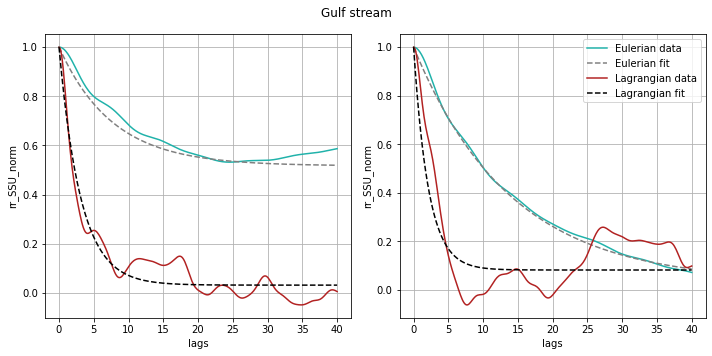

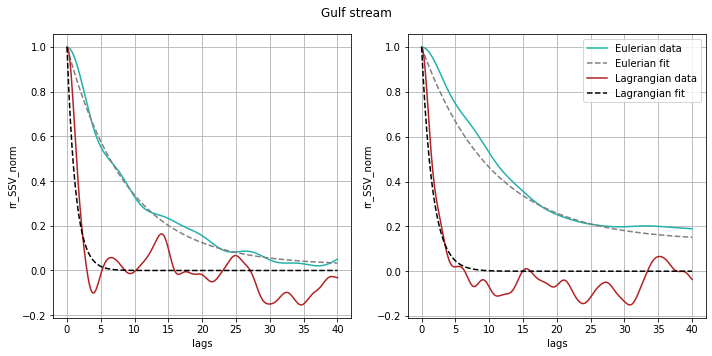

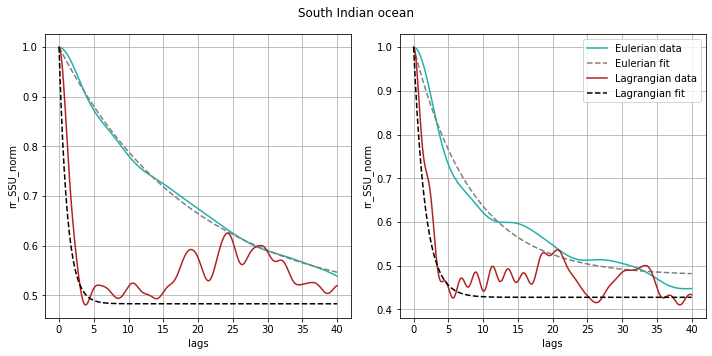

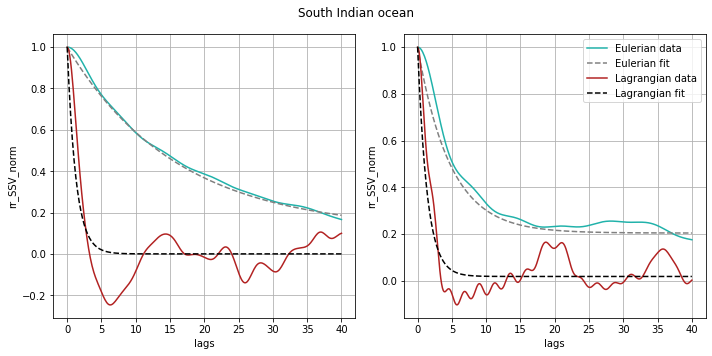

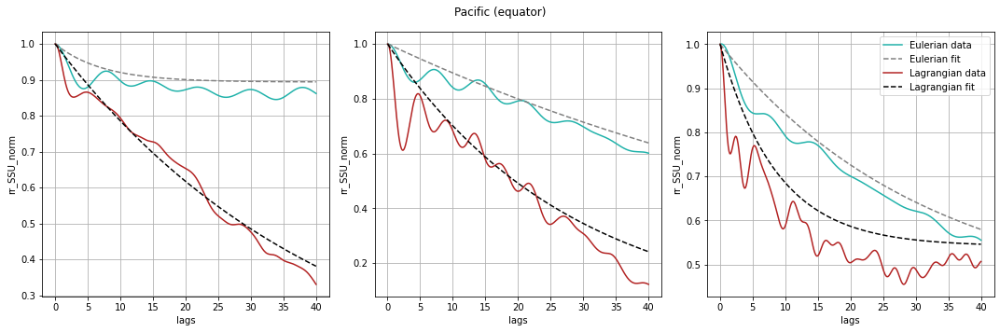

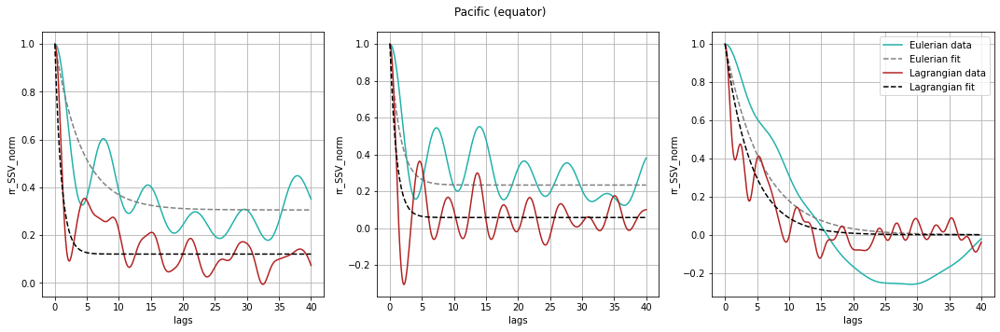

In [44]:
for k in areas.keys():
    for V in ['rr_SSU','rr_SSV']:
        fig,axs = plt.subplots(1,len(areas[k]),figsize=(5*len(areas[k]),5),sharey=False)
        for ax,pt in zip(axs,areas[k]):
            dsE_low[V+'_norm'].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                   ).plot(ax=ax,c='lightseagreen',label='Eulerian data');
            dsE_low_out[V+'_norm'].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                      ).plot(ax=ax,c='grey',linestyle='--',label='Eulerian fit');
            dsL_low[V+'_norm'].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                  ).plot(ax=ax,c='firebrick',label='Lagrangian data');
            dsL_low_out[V+'_norm'].sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest'
                                      ).plot(ax=ax,c='k',linestyle='--',label='Lagrangian fit');
            ax.grid();ax.set_title('');
    #        low_var = dsE_low.rr.sel(lat_bin=pt[1],lon_bin=pt[0],method='nearest').isel(lags=0).values
    #        ax.text(0,-0.004,r'$\overline{V}^2 \sim%s$'%np.around(low_var,decimals=4))
        ax.legend()
        fig.suptitle(k);fig.tight_layout();

In [116]:
Te_integrate = xr.merge([2*(dsE_low[V]).integrate('lags')/dsE_low[V].isel(lags=0) for V in ['rr_SSU','rr_SSV']])
Tl_integrate = xr.merge([(2*(dsL_low[V]).integrate('lags')/dsL_low[V].isel(lags=0)) for V in ['rr_SSU','rr_SSV']])
#.plot(y='lat_bin',vmax=10)

In [117]:
Te_integrate

<xarray.Dataset>
Dimensions:  (lon_bin: 179, lat_bin: 59)
Coordinates:
  * lon_bin  (lon_bin) float64 -179.0 -177.0 -175.0 -173.0 ... 173.0 175.0 177.0
  * lat_bin  (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 51.0 53.0 55.0 57.0
    lags     float64 0.0
Data variables:
    rr_SSU   (lon_bin, lat_bin) float64 57.87 45.65 40.52 ... 57.65 33.37 25.9
    rr_SSV   (lon_bin, lat_bin) float64 35.18 16.62 29.95 ... 42.58 20.74 25.29

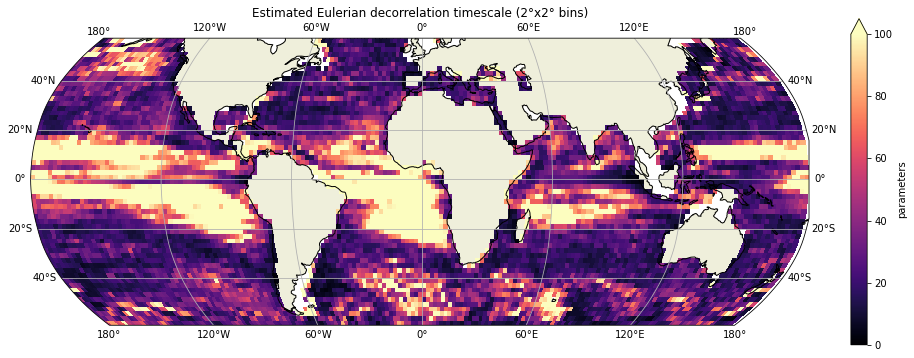

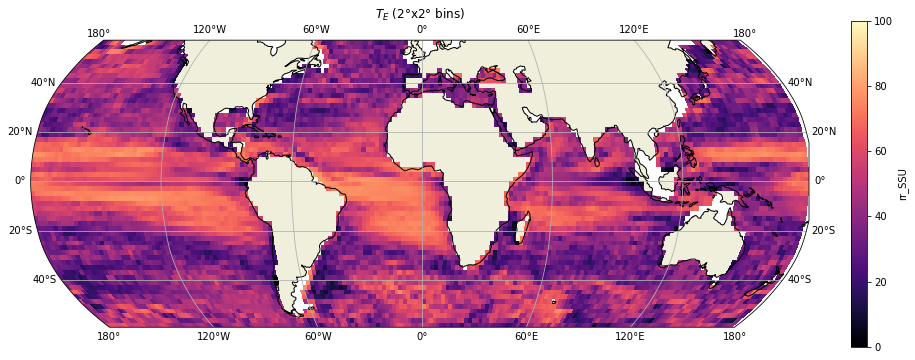

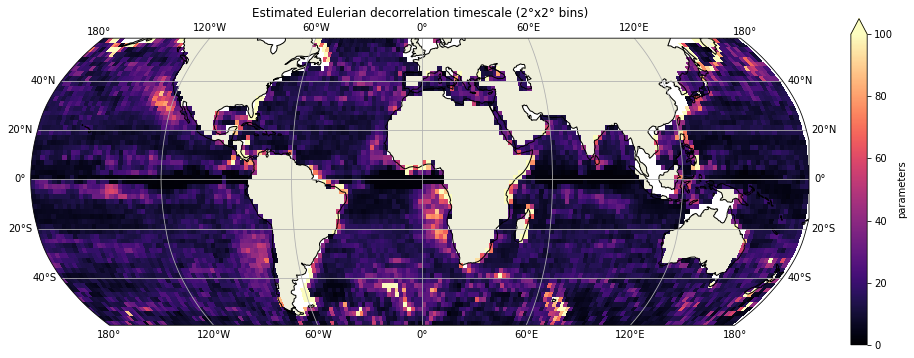

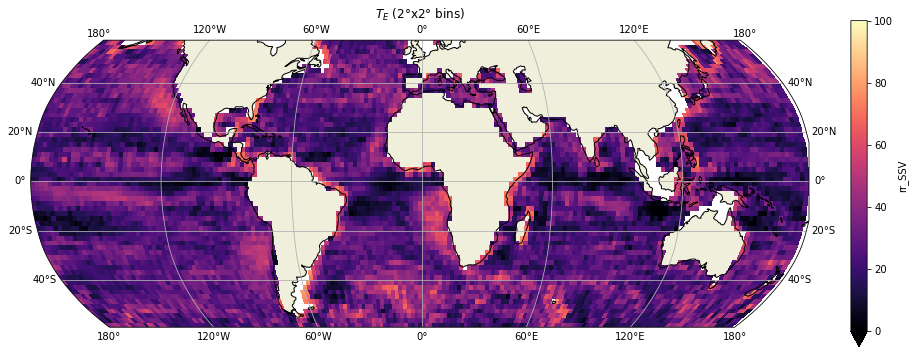

In [118]:
figsize=(15,6)
#SSU
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsE_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Eulerian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Te_integrate.rr_SSU,colmap='magma',vlim=(0,100))
ax.set_title(r'$T_E$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_Tintegrate_mean0.png')



# SSV
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsE_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Eulerian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Te_integrate.rr_SSV,colmap='magma',vlim=(0,100))
ax.set_title(r'$T_E$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_Tintegrate_SSV_mean0.png')



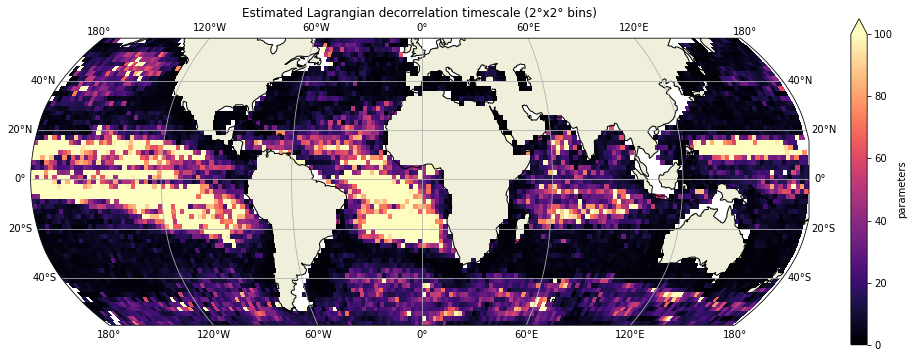

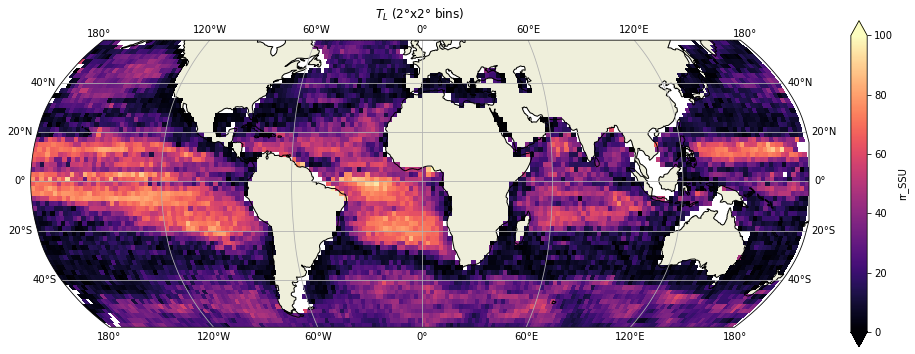

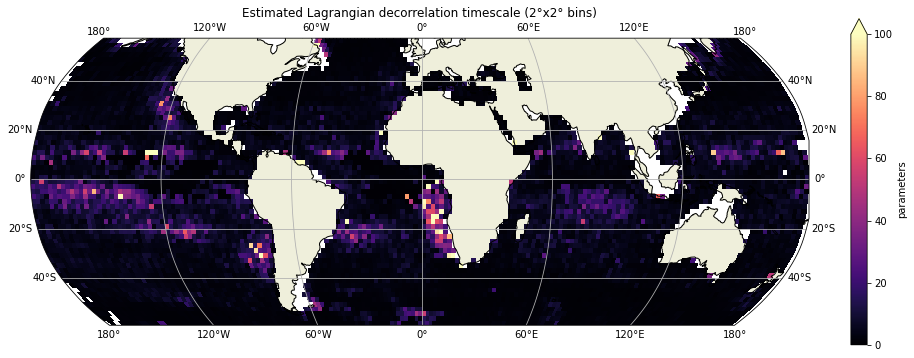

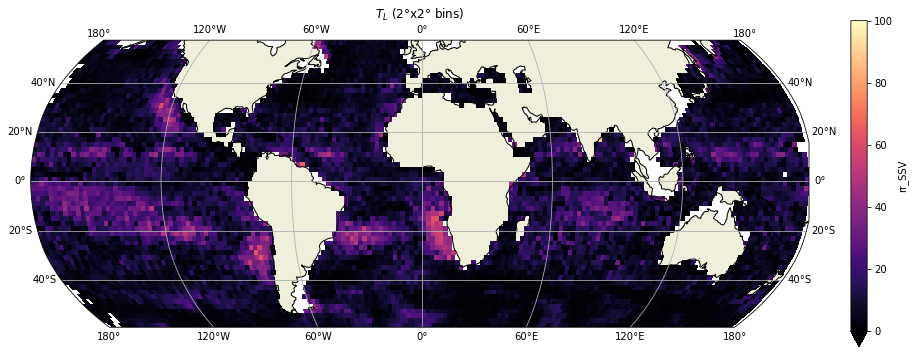

In [119]:
#SSU
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Tl_integrate.rr_SSU,colmap='magma',vlim=(0,100))
ax.set_title(r'$T_L$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tintegrate_mean0.png')


#SSV
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param = 'T').parameters,colmap='magma',vlim=(0,100))
ax.set_title('Estimated Lagrangian decorrelation timescale (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Tl_integrate.rr_SSV,colmap='magma',vlim=(0,100))
ax.set_title(r'$T_L$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tintegrate_SSV_mean0.png')



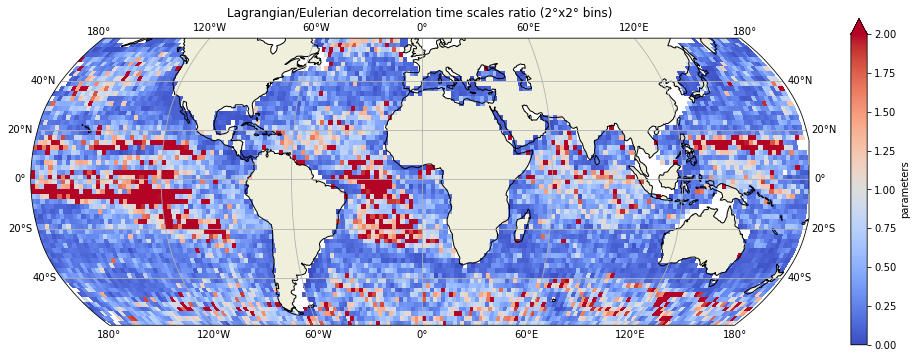

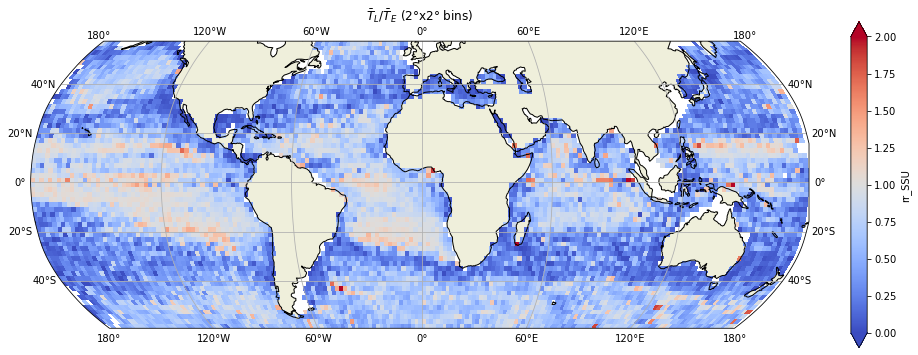

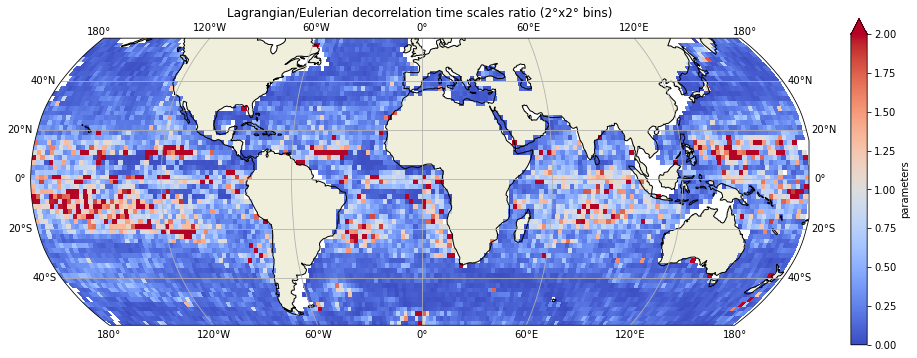

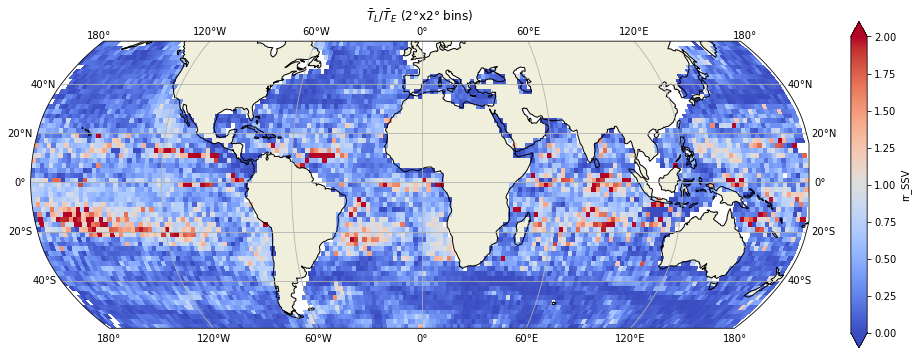

In [120]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(dsL_low_out.sel(param='T').parameters/dsE_low_out.sel(param='T').parameters,colmap='coolwarm',vlim=(0,2))
ax.set_title('Lagrangian/Eulerian decorrelation time scales ratio (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Tl_integrate.rr_SSU/Te_integrate.rr_SSU,colmap='coolwarm',vlim=(0,2))
ax.set_title(r'$\bar T_L/\bar T_E$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/LE_Tintegrate_mean0.png')


fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_dsL_low_out.sel(param='T').parameters/_dsE_low_out.sel(param='T').parameters,colmap='coolwarm',vlim=(0,2))
ax.set_title('Lagrangian/Eulerian decorrelation time scales ratio (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(Tl_integrate.rr_SSV/Te_integrate.rr_SSV,colmap='coolwarm',vlim=(0,2))
ax.set_title(r'$\bar T_L/\bar T_E$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_Tintegrate_SSV_mean0.png')



#### Estimates of k$ \bar V \bar T$

In [39]:
ds_low = xr.merge([xr.open_dataset(root_path+'energy_SSU_low_binned_dl2.0.nc'),
                  xr.open_dataset(root_path+'energy_SSV_low_binned_dl2.0.nc')])
ds_low_var = xr.open_dataset(root_path+'energy_SSU_low_variance_binned_dl2.0.nc')

In [40]:
rad = 2*np.pi
k = rad/200*1e-3
day2sec = 3600*24

In [41]:
ds_low_dl1

<xarray.Dataset>
Dimensions:       (lon_bin: 359, lat_bin: 119)
Coordinates:
  * lon_bin       (lon_bin) float64 -179.5 -178.5 -177.5 ... 176.5 177.5 178.5
  * lat_bin       (lat_bin) float64 -59.5 -58.5 -57.5 -56.5 ... 56.5 57.5 58.5
Data variables:
    E_count       (lon_bin, lat_bin) int64 288 276 276 264 ... 264 276 252 251
    E_energy_SSU  (lon_bin, lat_bin) float64 ...
    L_energy_SSU  (lon_bin, lat_bin) float64 ...
    waterdepth    (lon_bin, lat_bin) float64 4.347e+03 4.968e+03 ... 3.745e+03
    L_count       (lon_bin, lat_bin) int64 217 215 186 488 ... 5994 6380 2066
    E_energy_SSV  (lon_bin, lat_bin) float64 ...
    L_energy_SSV  (lon_bin, lat_bin) float64 ...

In [47]:
Uebar = np.sqrt(ds_low_dl2.E_energy_SSU)
Ulbar = np.sqrt(ds_low_dl2.L_energy_SSU)

Vebar = np.sqrt(ds_low_dl2.E_energy_SSV)
Vlbar = np.sqrt(ds_low_dl2.L_energy_SSV)

Uebar_bis = np.sqrt(ds_low_var.E_energy_SSU)
Ulbar_bis = np.sqrt(ds_low_var.L_energy_SSU)

Tebar = dsE_low_out.sel(param='T').parameters
Tlbar = dsL_low_out.sel(param='T').parameters

Tebar_V = _dsE_low_out.sel(param='T').parameters
Tlbar_V = _dsL_low_out.sel(param='T').parameters

Tebar_v1 = dsE_low_out_v1.sel(param='T').parameters
Tlbar_v1 = dsL_low_out_v1.sel(param='T').parameters

Tebar_V_v1 = _dsE_low_out_v1.sel(param='T').parameters
Tlbar_V_v1 = _dsL_low_out_v1.sel(param='T').parameters

In [43]:
Uebar

<xarray.DataArray 'E_energy_SSU' (lon_bin: 179, lat_bin: 59)>
array([[0.24427825, 0.22634683, 0.3337826 , ..., 0.11670178, 0.09986056,
        0.0977287 ],
       [0.23007457, 0.23877783, 0.38217918, ..., 0.17354122, 0.08872898,
        0.10738218],
       [0.21954801, 0.25512093, 0.33130095, ..., 0.17179351, 0.08626291,
        0.15146153],
       ...,
       [0.18870177, 0.22318326, 0.43818331, ..., 0.16878848, 0.09920553,
        0.12495439],
       [0.1935309 , 0.23354926, 0.29873348, ..., 0.17568443, 0.09605577,
        0.10534379],
       [0.1816512 , 0.26198921, 0.25358429, ..., 0.17553316, 0.12617125,
        0.11428192]])
Coordinates:
  * lon_bin  (lon_bin) float64 -179.0 -177.0 -175.0 -173.0 ... 173.0 175.0 177.0
  * lat_bin  (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 51.0 53.0 55.0 57.0

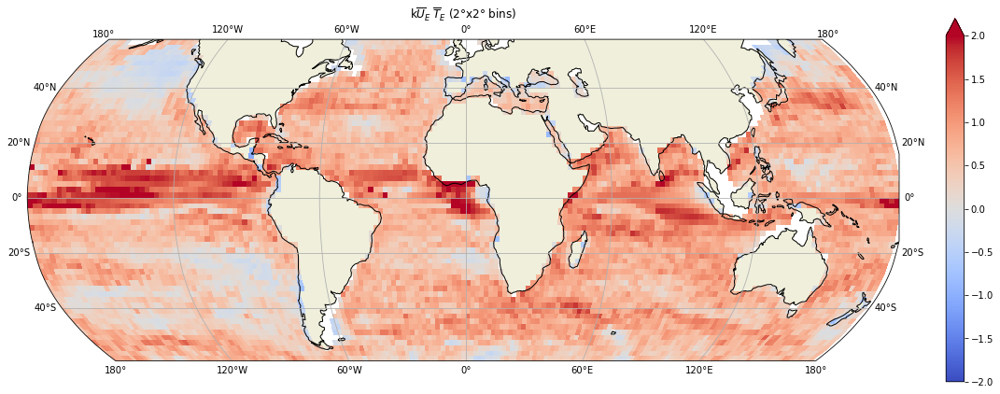

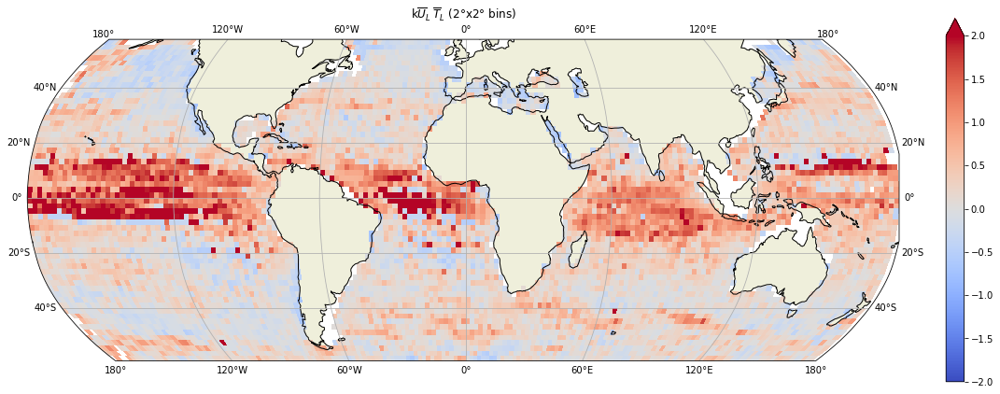

In [44]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Uebar*Tebar*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_kUT_mean0.png',bbox_inches="tight")

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Ulbar*Tlbar*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_kUT_mean0.png',bbox_inches="tight")



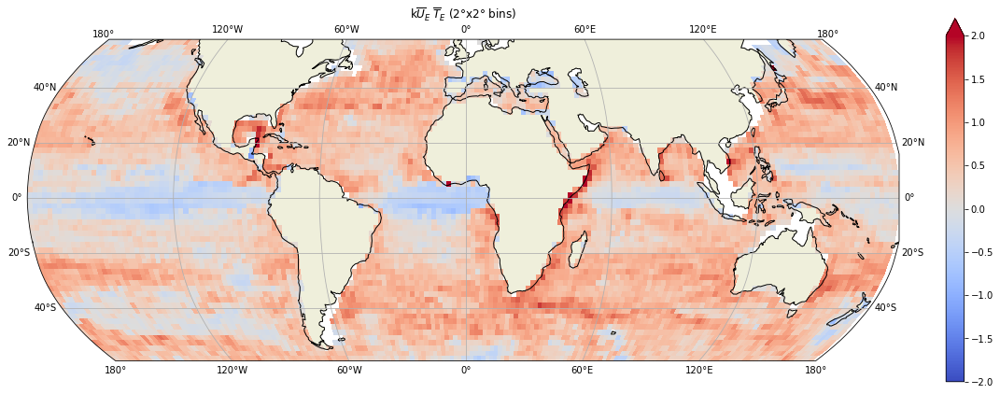

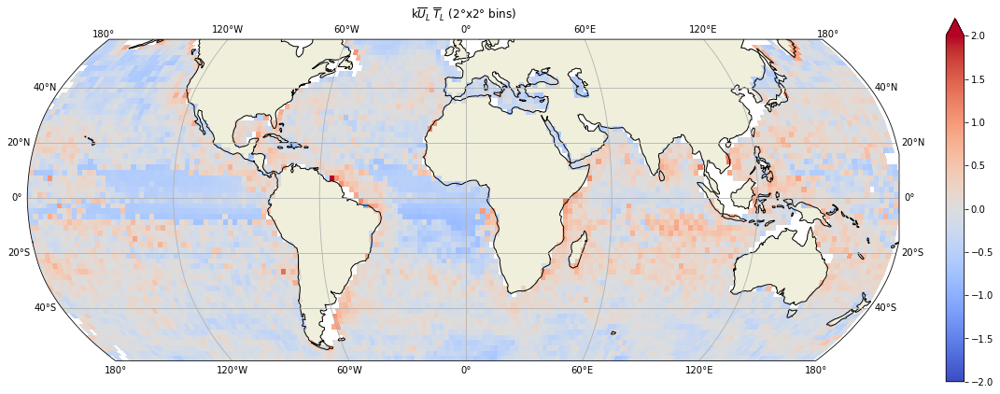

In [46]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Vebar*Tebar_V*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_kUT_SSV_mean0.png',bbox_inches="tight")

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Vlbar*Tlbar_V*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_kUT_SSV_mean0.png',bbox_inches="tight")




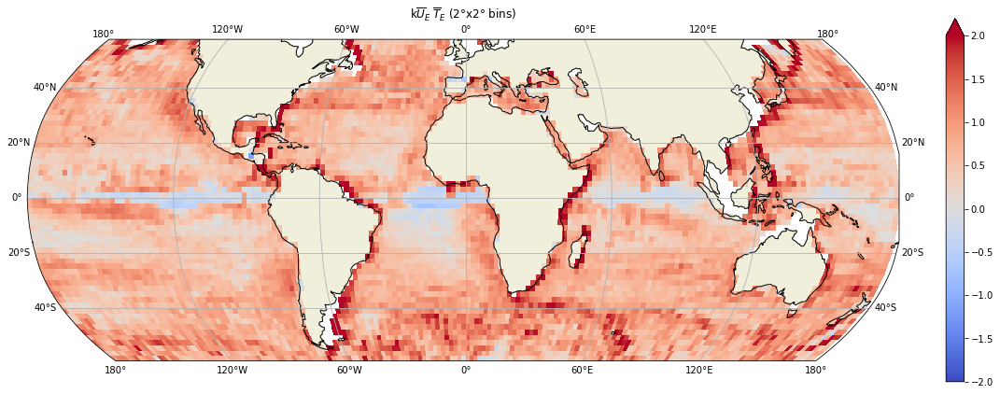

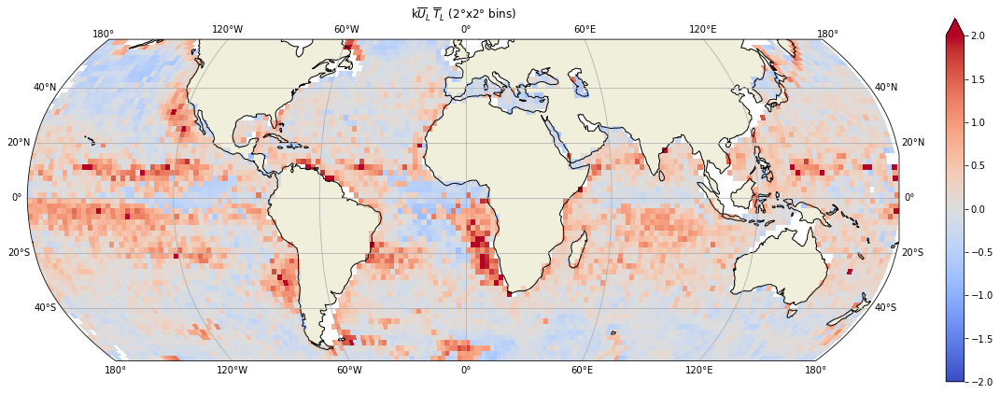

In [48]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Vebar*Tebar_V_v1*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')
fig.tight_layout()

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Vlbar*Tlbar_V_v1*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_kUT_SSV_mean0_v1.png',bbox_inches="tight")




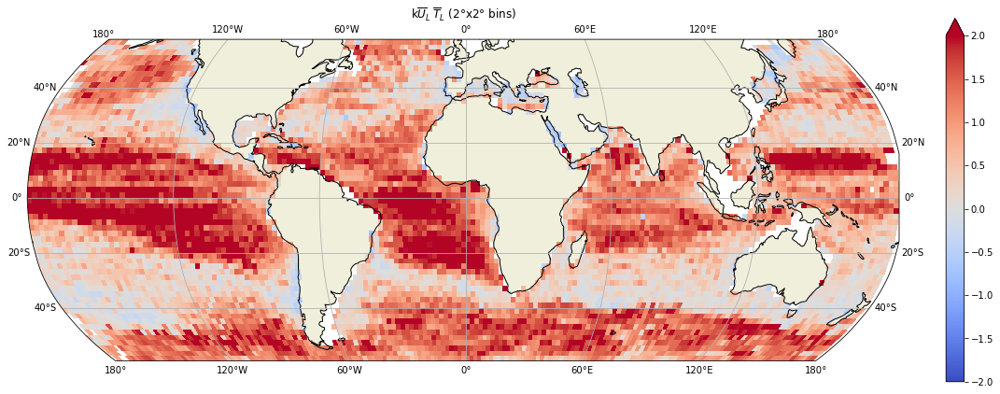

In [49]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Ulbar*Tlbar_v1*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_kUT_mean0_v1.png',bbox_inches="tight")

Text(0.5, 1.0, 'k$\\overline{U}_L \\: \\overline{T}_L$ (2°x2° bins)')

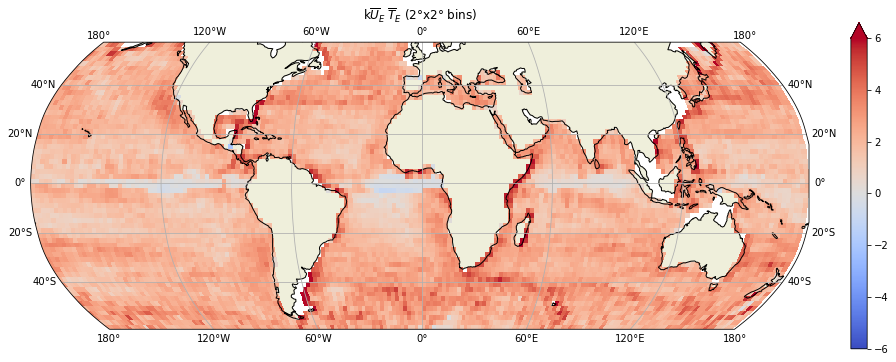

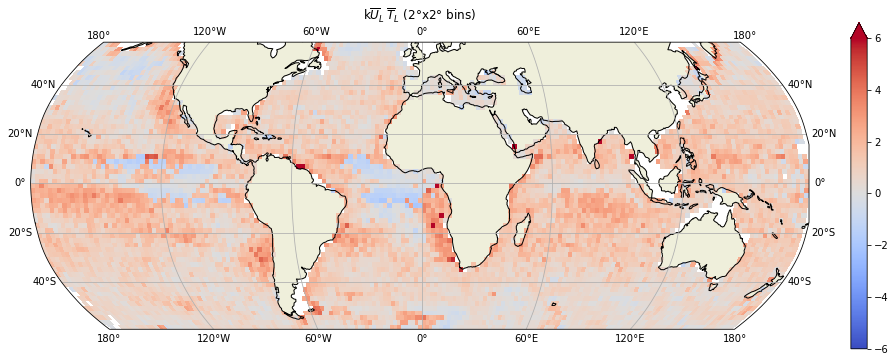

In [131]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Vebar*Tebar_V*day2sec),colmap='coolwarm',vlim=(-6,6))
ax.set_title(r'k$\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log(k*Vlbar*Tlbar_V*day2sec),colmap='coolwarm',vlim=(-6,6))
ax.set_title(r'k$\overline{U}_L \: \overline{T}_L$ (2°x2° bins)')

In [50]:
k = xr.open_dataset(root_path+'k_estimate.nc').rename({'lon_bins':'lon_bin','lat_bins':'lat_bin'})

In [51]:
k = k.k#*Uebar_bis*Te_integrate*day2sec

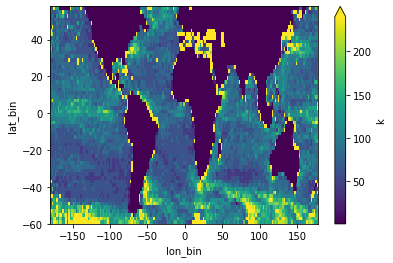

In [65]:
(2*np.pi*1e-3/k).plot(y='lat_bin',vmax=240)

In [66]:
k

<xarray.DataArray 'k' (lon_bin: 179, lat_bin: 59)>
array([[3.471373e-05, 5.192715e-05, 3.471373e-05, ..., 1.030030e-04,
        7.757019e-05, 1.030030e-04],
       [4.456160e-05, 3.902600e-05, 3.125963e-05, ..., 6.220976e-05,
        1.030030e-04, 7.757019e-05],
       [6.404878e-06, 2.843070e-05, 3.471373e-05, ..., 1.030030e-04,
        1.030030e-04, 6.404878e-06],
       ...,
       [4.456160e-05, 3.902600e-05, 2.607131e-05, ..., 7.757019e-05,
        1.030030e-04, 7.757019e-05],
       [4.456160e-05, 3.471373e-05, 3.902600e-05, ..., 7.757019e-05,
        1.030030e-04, 3.471373e-05],
       [4.456160e-05, 3.902600e-05, 3.902600e-05, ..., 1.030030e-04,
        7.757019e-05, 6.220976e-05]])
Coordinates:
    T        (lon_bin, lat_bin) float64 ...
    Ubar     (lon_bin, lat_bin) float64 ...
    Tbar     (lon_bin, lat_bin) float64 ...
  * lon_bin  (lon_bin) float64 -179.0 -177.0 -175.0 -173.0 ... 173.0 175.0 177.0
  * lat_bin  (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 51.0 53.0 55.0 57.0

In [54]:
k = k.where(2*np.pi/k*1e-3>1)

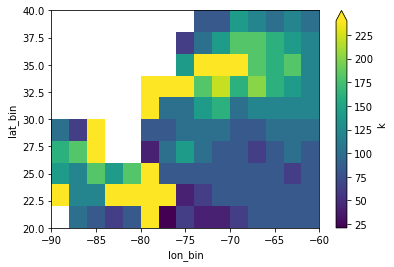

In [68]:
(2*np.pi*1e-3/k).where((k.lon_bin<-60) & (k.lon_bin>-90) & (k.lat_bin<40) & (k.lat_bin>20),drop=True).plot(y='lat_bin',vmax=240)

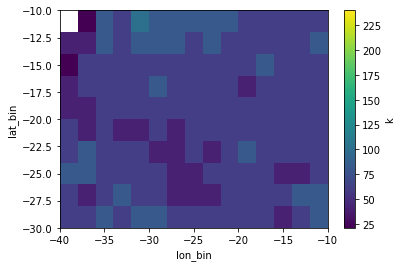

In [69]:
(2*np.pi*1e-3/k).where((k.lon_bin<-10) & (k.lon_bin>-40) & (k.lat_bin<-10) & (k.lat_bin>-30),drop=True).plot(y='lat_bin',vmax=240)

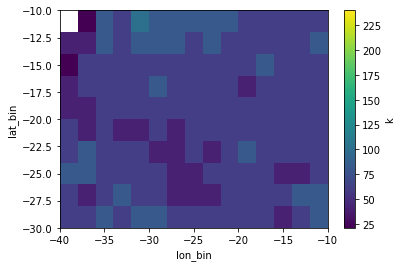

In [70]:
(2*np.pi*1e-3/k).where((k.lon_bin<-10) & (k.lon_bin>-40) & (k.lat_bin<-10) & (k.lat_bin>-30),drop=True).plot(y='lat_bin',vmax=240)

In [71]:
k

<xarray.DataArray 'k' (lon_bin: 179, lat_bin: 59)>
array([[3.47137310e-05, 5.19271513e-05, 3.47137310e-05, ...,
        1.03003038e-04, 7.75701890e-05, 1.03003038e-04],
       [4.45615979e-05, 3.90259957e-05, 3.12596284e-05, ...,
        6.22097555e-05, 1.03003038e-04, 7.75701890e-05],
       [6.40487799e-06, 2.84307027e-05, 3.47137310e-05, ...,
        1.03003038e-04, 1.03003038e-04, 6.40487799e-06],
       ...,
       [4.45615979e-05, 3.90259957e-05, 2.60713083e-05, ...,
        7.75701890e-05, 1.03003038e-04, 7.75701890e-05],
       [4.45615979e-05, 3.47137310e-05, 3.90259957e-05, ...,
        7.75701890e-05, 1.03003038e-04, 3.47137310e-05],
       [4.45615979e-05, 3.90259957e-05, 3.90259957e-05, ...,
        1.03003038e-04, 7.75701890e-05, 6.22097555e-05]])
Coordinates:
    T        (lon_bin, lat_bin) float64 22.08 28.25 25.03 ... 73.3 36.65 71.84
    Ubar     (lon_bin, lat_bin) float64 0.2443 0.2263 0.3338 ... 0.1262 0.1143
    Tbar     (lon_bin, lat_bin) float64 6.92 5.138 9.032 ... 6.774 8.783 7.025
  * lon_bin  (lon_bin) float64 -179.0 -177.0 -175.0 -173.0 ... 173.0 175.0 177.0
  * lat_bin  (lat_bin) float64 -59.0 -57.0 -55.0 -53.0 ... 51.0 53.0 55.0 57.0

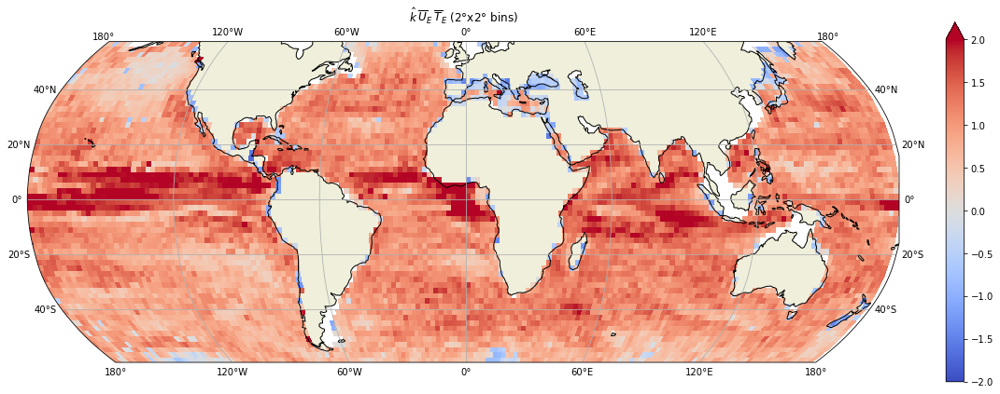

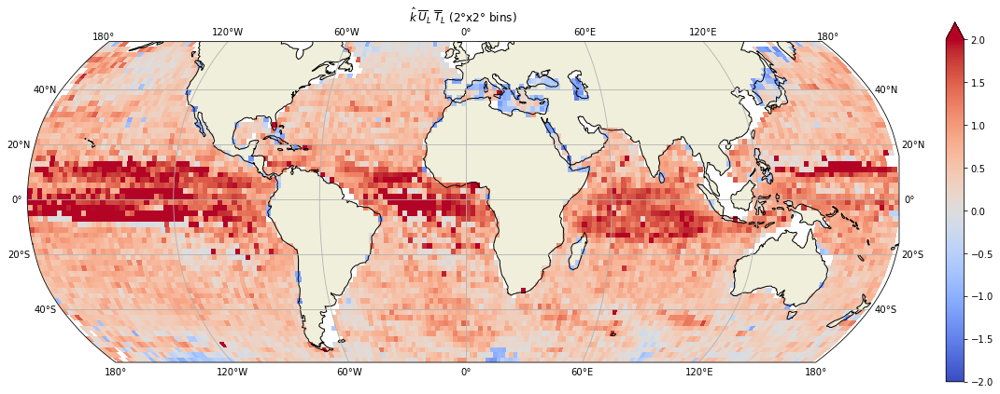

In [52]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Uebar*Tebar*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'$\hat{k}\:\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_kestimateUT_mean0.png',bbox_inches='tight')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Ulbar*Tlbar*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'$\hat{k}\:\overline{U}_L \: \overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_kestimateUT_mean0.png',bbox_inches='tight')

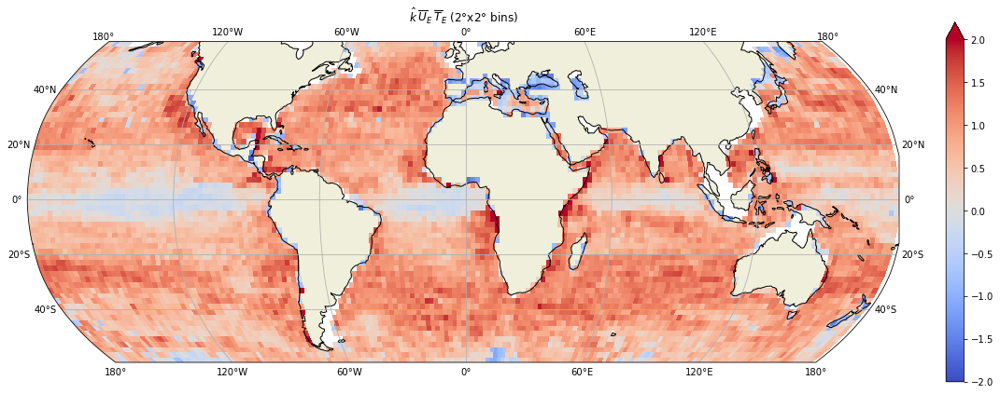

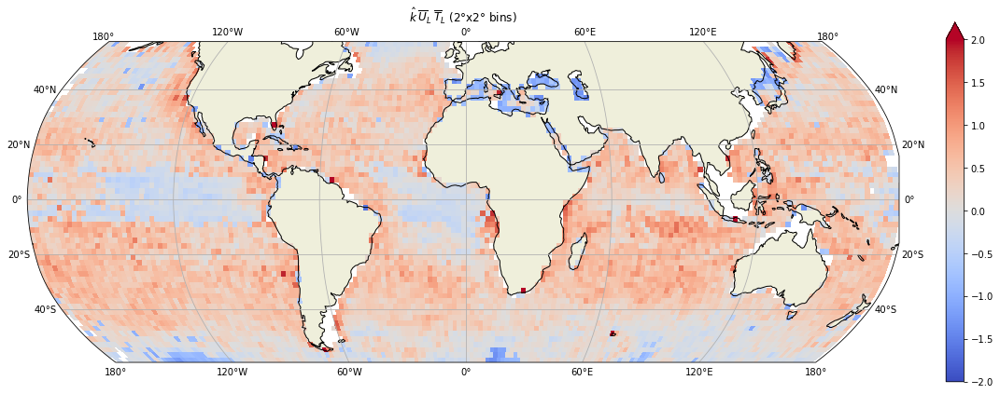

In [53]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Vebar*Tebar_V*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'$\hat{k}\:\overline{U}_E \: \overline{T}_E$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/E_kestimateUT_SSV_mean0.png',bbox_inches='tight')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Vlbar*Tlbar_V*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'$\hat{k}\:\overline{U}_L \: \overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_kestimateUT_SSV_mean0.png',bbox_inches='tight')

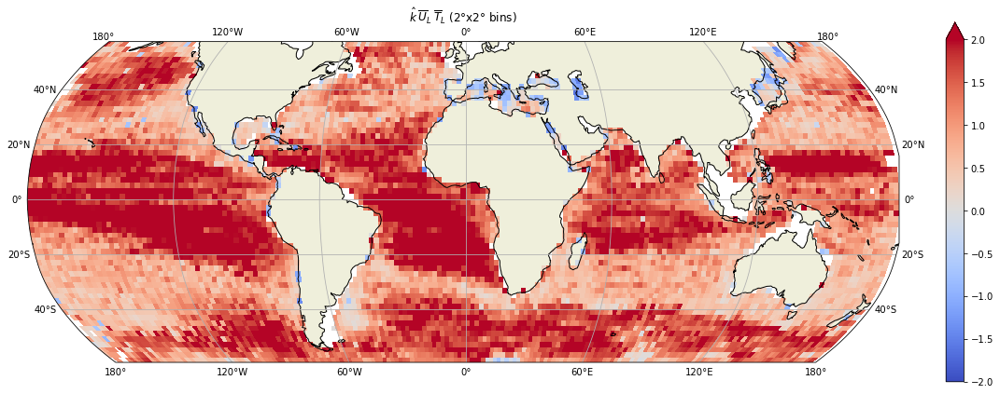

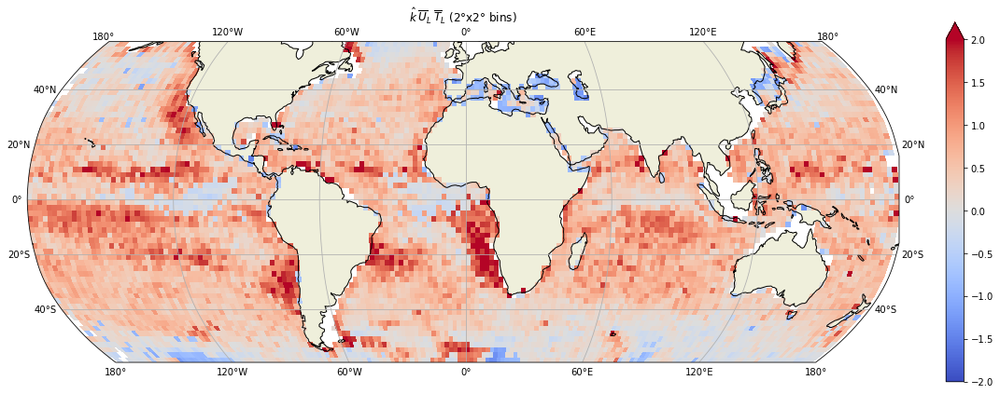

In [54]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Ulbar*Tlbar_v1*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'$\hat{k}\:\overline{U}_L \: \overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_kestimateUT_mean0_v1.png',bbox_inches='tight')

fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(np.log10(k*Vlbar*Tlbar_V_v1*day2sec),colmap='coolwarm',vlim=(-2,2))
ax.set_title(r'$\hat{k}\:\overline{U}_L \: \overline{T}_L$ (2°x2° bins)')
fig.tight_layout()
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/L_kestimateUT_SSV_mean0_v1.png',bbox_inches='tight')

In [55]:
contamination = lambda ds : 4*ds['domega']/(np.pi*ds['omega']**2*ds['T'])

In [56]:
T = dsL_low_out.sel(param='T').parameters
U = Uebar#hf_dl2.E_energy_SSU.values
domega = 0.2
_omega = omega

In [57]:
ds_contamination = xr.Dataset({'omega':_omega,'domega':domega,'T':T})

In [58]:
_omega

1.9661368071336223

In [59]:
_ds = contamination(ds_contamination)


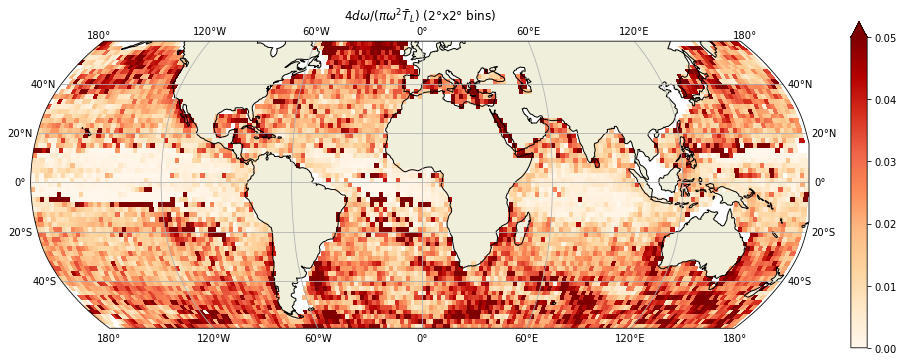

In [60]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_ds,vlim=(0,0.05),colmap=cmap)
ax.set_title(r'$4d\omega/(\pi\omega^2\bar T_L)$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/lf_contamination.png')

In [61]:
T = dsL_low_out_v1.sel(param='T').parameters
ds_contamination = xr.Dataset({'omega':_omega,'domega':domega,'T':T})
_ds = contamination(ds_contamination)



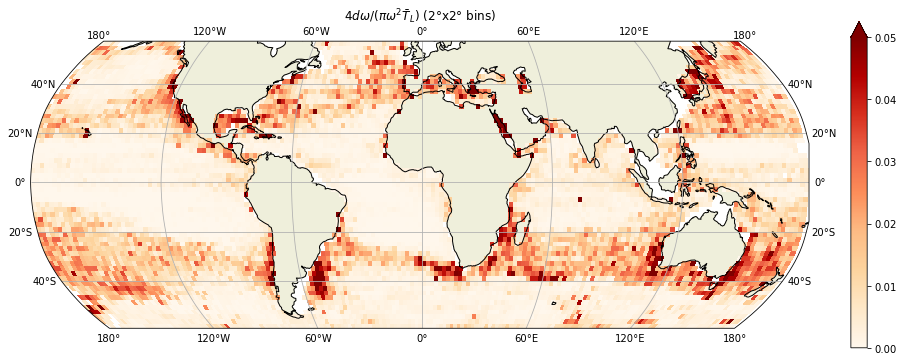

In [62]:
fig = plt.figure(figsize=figsize)
fig,ax = plot_maps(_ds,vlim=(0,0.05),colmap=cmap)
ax.set_title(r'$4d\omega/(\pi\omega^2\bar T_L)$ (2°x2° bins)')
fig.savefig('/Users/zcaspar/Documents/Figures_manuscript/lf_contamination_v1.png')